<h2 style="color:#35ff4c">MACHINE LEARNING MODELS TO PREDICT AVERAGE COST OF TWO PEOPLE AND PRICE RANGE OF FOOD ⬇️</h2>

<p style="font-size:140%;color:maroon">Importing the necessary libraries ↩️</p>

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

<p style="font-size:140%;color:#ff843c">Importing the dataset ↩️</p>

<p style="font-size:140%;color:#a963ff">While importing the dataset, we have use proper ecoding format which we can use with the help of codecs library because in this dataset there are some Turkish alphabets also</p>

In [2]:
#importing the codecs library
import codecs

In [3]:
with codecs.open('zomato.csv','r', encoding='ISO-8859-1') as file:
    df = pd.read_csv(file)
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [4]:
pd.set_option('display.max_columns', 500)
#Setting the option to display all columns in the dataset

In [5]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


<p style="font-size:140%;color:maroon">Now, importing the second dataset ⤵️</p>

In [6]:
dataframe = pd.read_excel('Country-Code.xlsx')
dataframe

,Country Code,Country
0,1,India
1,14,Australia
2,30,Brazil
3,37,Canada
4,94,Indonesia
5,148,New Zealand
6,162,Phillipines
7,166,Qatar
8,184,Singapore
9,189,South Africa


<p style="font-size:140%;color:maroon">We will combine these datasets and country code is the common column and we will create a new column in zomato dataset 'Country'</p>

In [7]:
df = pd.merge(df, dataframe, on='Country Code')
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788,Turkey
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034,Turkey
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661,Turkey
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901,Turkey


<h2 style="color:#2023ff">EXPLORATORY DATA ANALYSIS ⤵️</h2>

In [8]:
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines


In [9]:
df.tail()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788,Turkey
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034,Turkey
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661,Turkey
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901,Turkey
9550,5927402,Walter's Coffee Roastery,208,ÛÁstanbul,"CafeaÛôa Mahallesi, BademaltÛ± Sokak, No 21/B,...",Moda,"Moda, ÛÁstanbul",29.026016,40.984776,Cafe,55,Turkish Lira(TL),No,No,No,No,2,4.0,Green,Very Good,591,Turkey


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   int64  
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9542 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [11]:
df.describe()

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9.551000e+03,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,9.051128e+06,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,8.791521e+06,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,5.300000e+01,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,3.019625e+05,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,6.004089e+06,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.835229e+07,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,1.850065e+07,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [12]:
df.isnull().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
Country                 0
dtype: int64

In [13]:
df.isnull().sum().sum()

9

<p style="font-size:140%;color:#ff9bdc">There are total 9 null values in the entire dataset and all are in cuisine column.</p>

In [14]:
df.duplicated()

0       False
1       False
2       False
3       False
4       False
        ...  
9546    False
9547    False
9548    False
9549    False
9550    False
Length: 9551, dtype: bool

In [15]:
df.duplicated().sum()

0

<p style="font-size:140%;color:#ff5500">There are zero duplicate samples in the dataset.</p>

In [16]:
df.skew(numeric_only=True)

Restaurant ID            0.061570
Country Code             3.043965
Longitude               -2.807328
Latitude                -3.081635
Average Cost for two    35.477915
Price range              0.889618
Aggregate rating        -0.954130
Votes                    8.807637
dtype: float64

<p style="font-size:140%;color:#aa557f">We can only remove skewness from "Votes" beacuse rest cannot be tampered with due to importance of actual values of these columns.</p>

<h2 style="color:#4d9093">DATA VISUALIZATION ⤵️</h2>

In [17]:
import warnings
warnings.filterwarnings(action='ignore')

<Axes: xlabel='Price range', ylabel='count'>

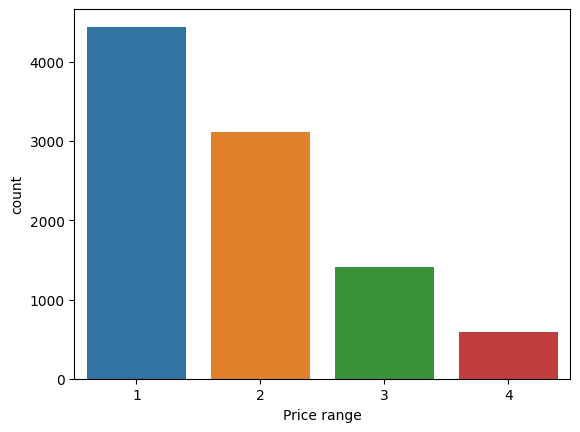

In [18]:
sns.countplot(data=df, x='Price range', palette='tab10')

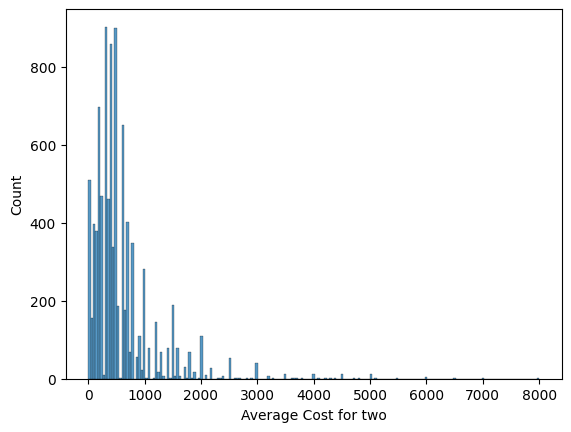

In [19]:
sns.histplot(data=df[df['Average Cost for two']<10000], x='Average Cost for two')
plt.show()

In [20]:
#We removed some very few outliers from the graph

<Figure size 1200x800 with 0 Axes>

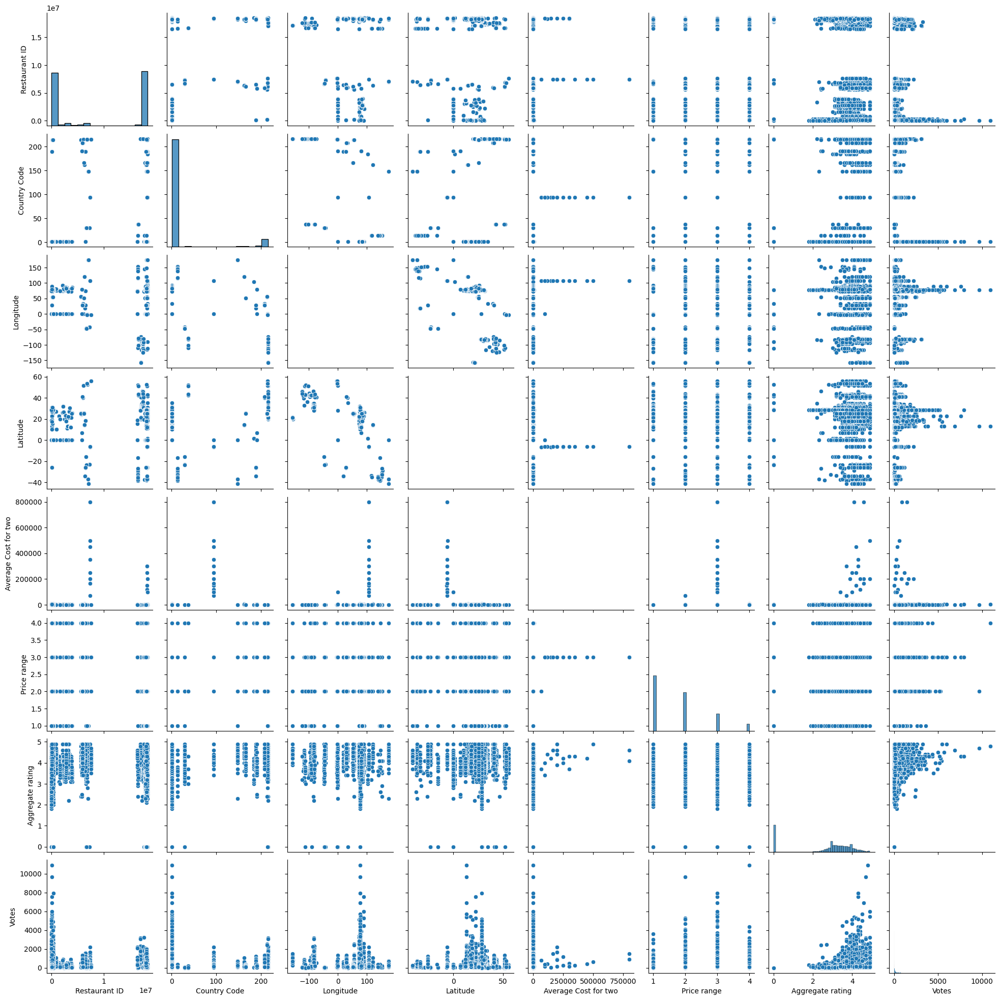

In [21]:
plt.figure(figsize=(12,8))
sns.pairplot(data=df, palette='tab10')
plt.show()

In [22]:
num_cols = df.select_dtypes(include=['int64','float64']).columns.to_list()
num_cols

['Restaurant ID',
 'Country Code',
 'Longitude',
 'Latitude',
 'Average Cost for two',
 'Price range',
 'Aggregate rating',
 'Votes']

In [23]:
cat_cols = df.select_dtypes(include=['object']).columns.to_list()
cat_cols

['Restaurant Name',
 'City',
 'Address',
 'Locality',
 'Locality Verbose',
 'Cuisines',
 'Currency',
 'Has Table booking',
 'Has Online delivery',
 'Is delivering now',
 'Switch to order menu',
 'Rating color',
 'Rating text',
 'Country']

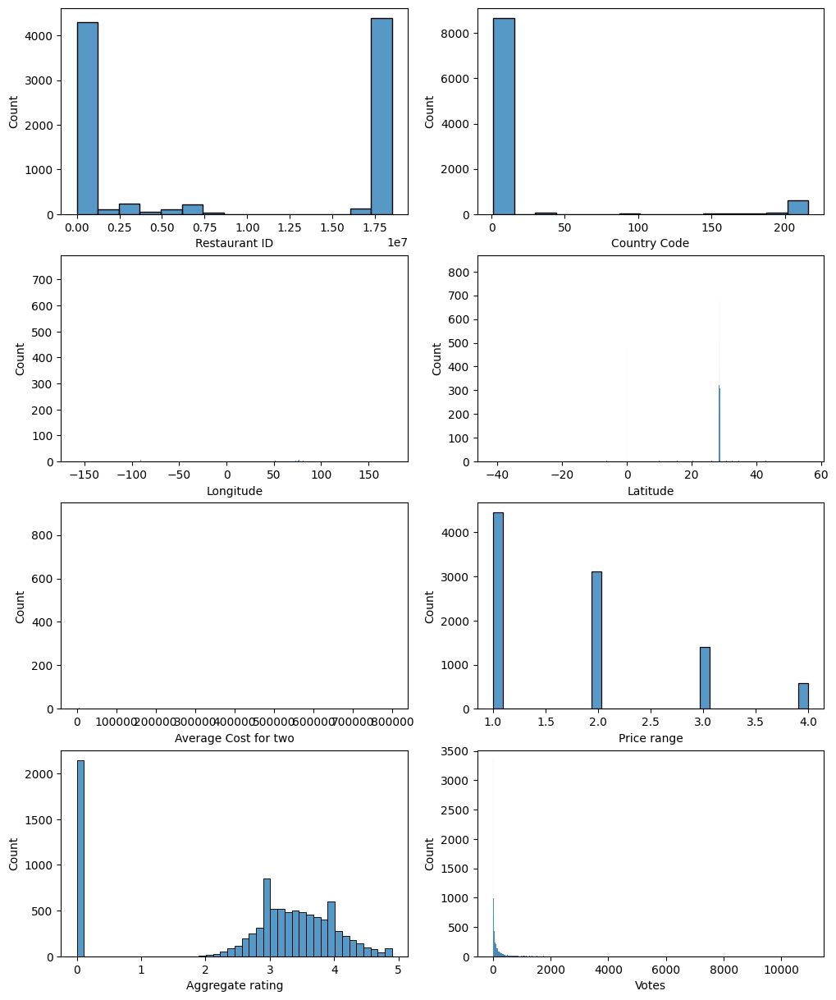

In [24]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12,15))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(4,2, plotnumber)
    sns.histplot(data=df, x=x)
    plotnumber += 1
plt.show()

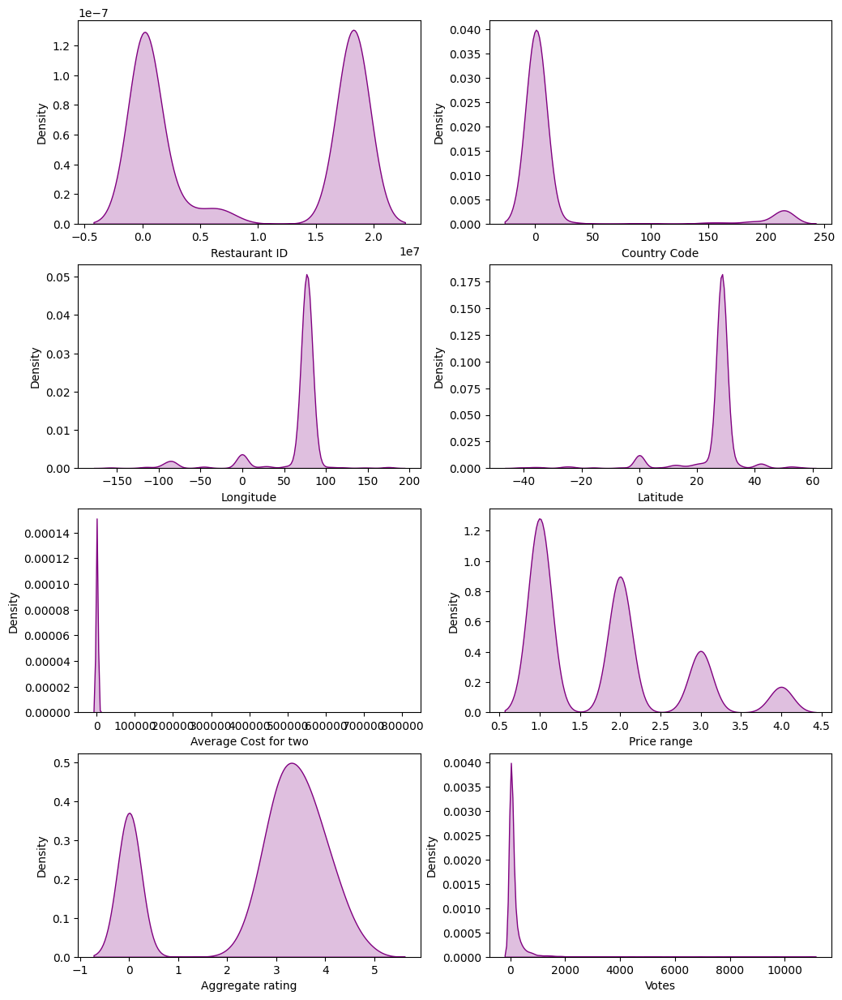

In [25]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12,15))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(4,2, plotnumber)
    sns.kdeplot(data=df, x=x, fill=True, color='purple')
    plotnumber += 1
plt.show()

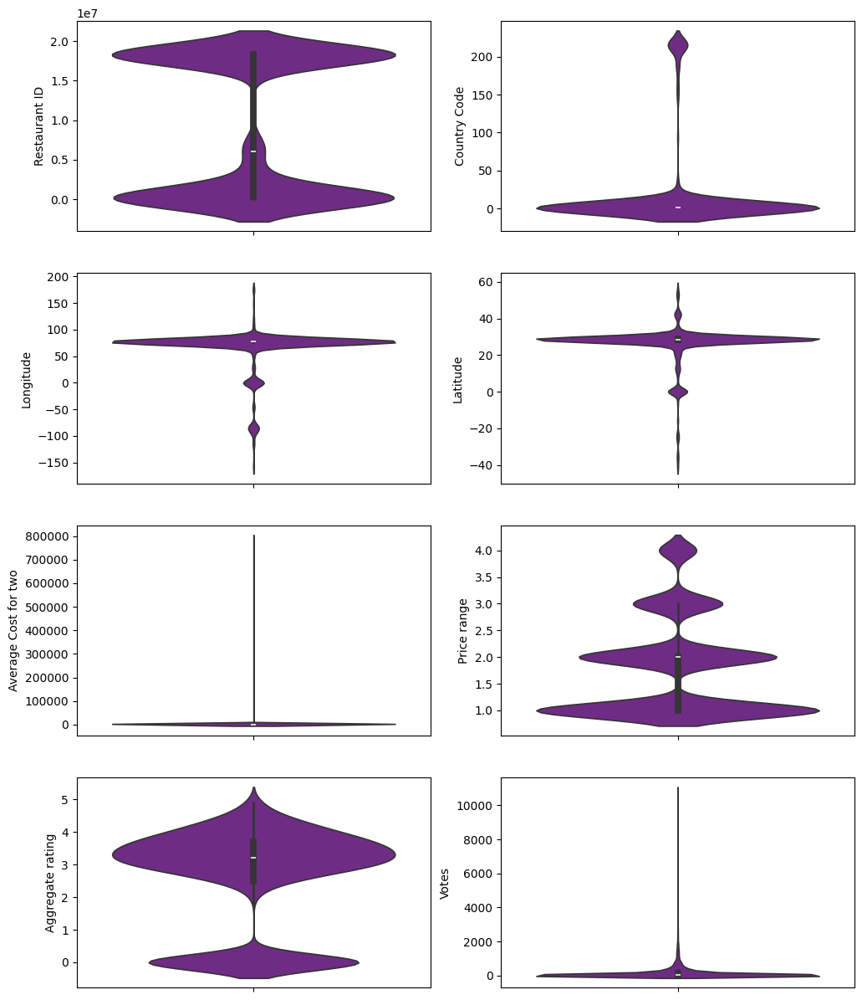

In [26]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12,15))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(4,2, plotnumber)
    sns.violinplot(data=df, y=x, color='#761d93')
    plotnumber += 1
plt.show()

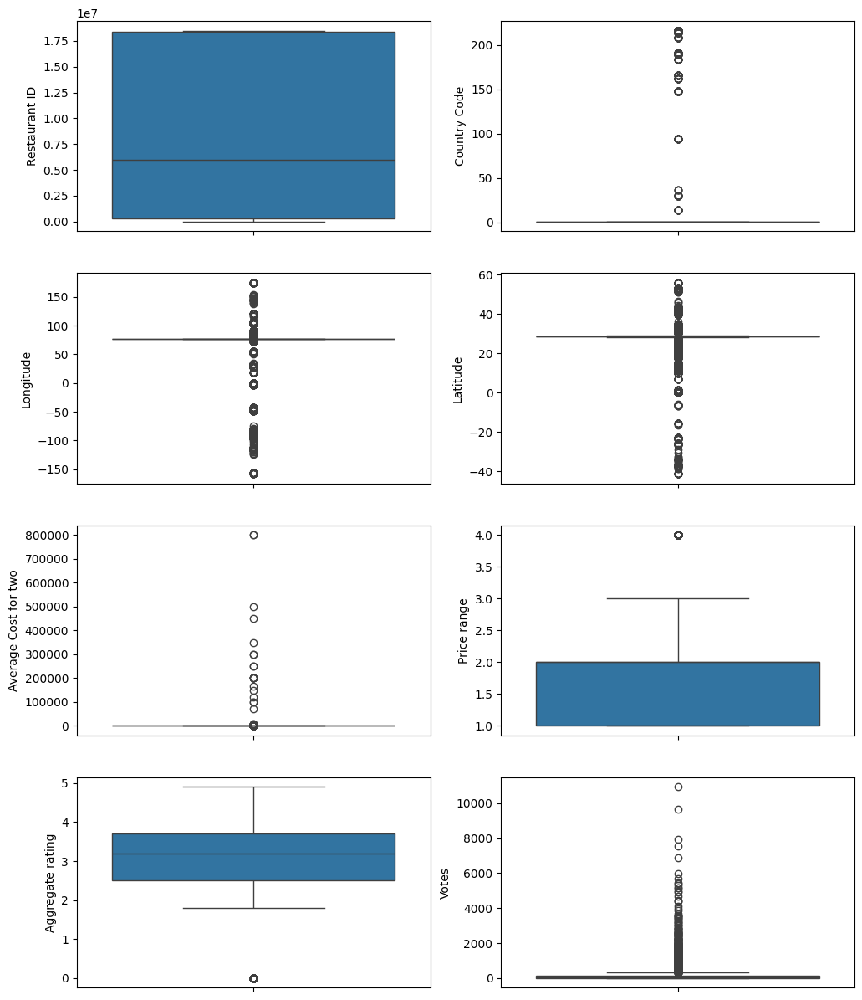

In [27]:
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(12,15))
plotnumber = 1
for x in num_cols:
    ax = plt.subplot(4,2, plotnumber)
    sns.boxplot(data=df, y=x)
    plotnumber += 1
plt.show()

In [28]:
#Now, we will try to create some useful data graphs

<Axes: xlabel='Votes', ylabel='Count'>

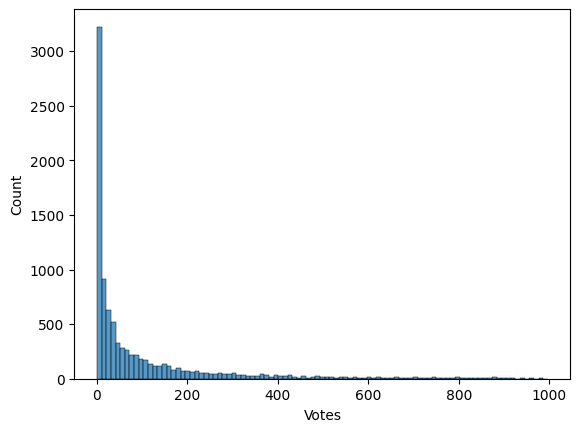

In [29]:
sns.histplot(data=df[df['Votes']<1000], x='Votes')

<Axes: xlabel='Average Cost for two', ylabel='Count'>

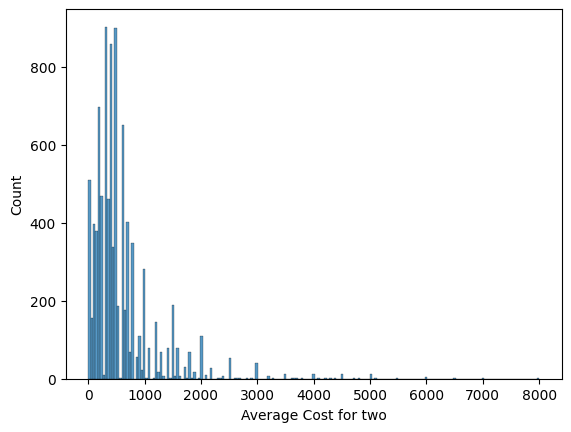

In [30]:
sns.histplot(data=df[df['Average Cost for two']<10000], x='Average Cost for two')

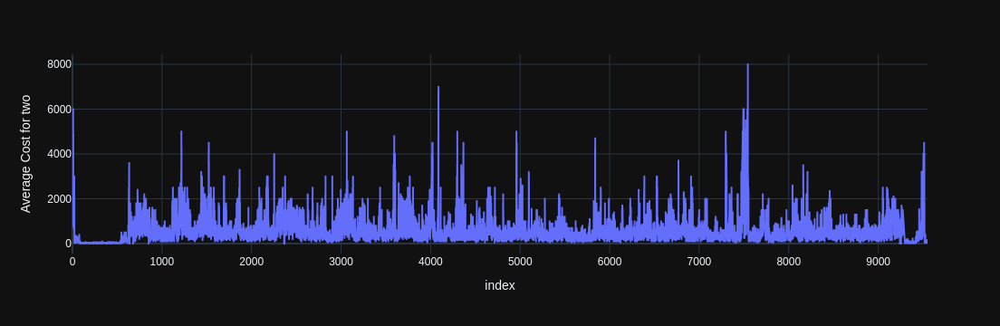

In [31]:
px.line(data_frame=df[df['Average Cost for two']<10000], y='Average Cost for two', template='plotly_dark')

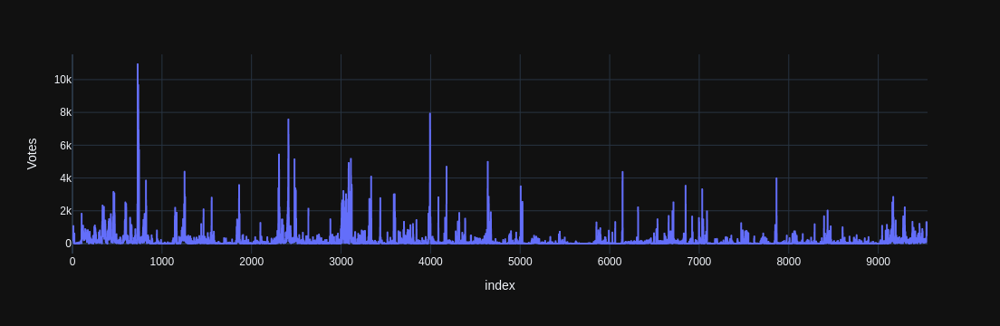

In [32]:
px.line(data_frame=df, y='Votes', template='plotly_dark')

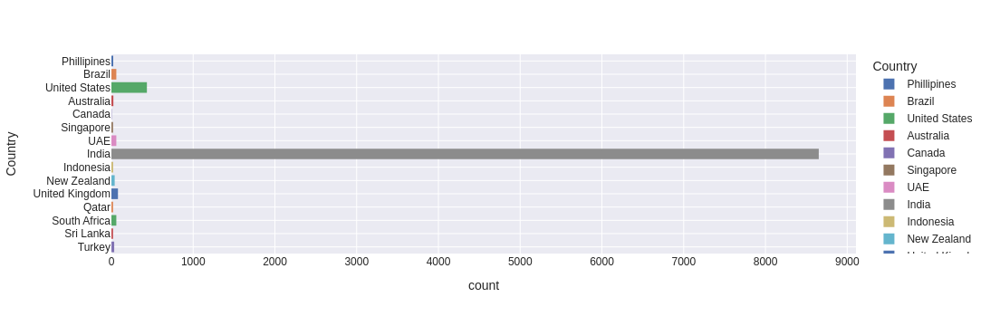

In [33]:
px.histogram(data_frame=df, y='Country',color='Country',template='seaborn')

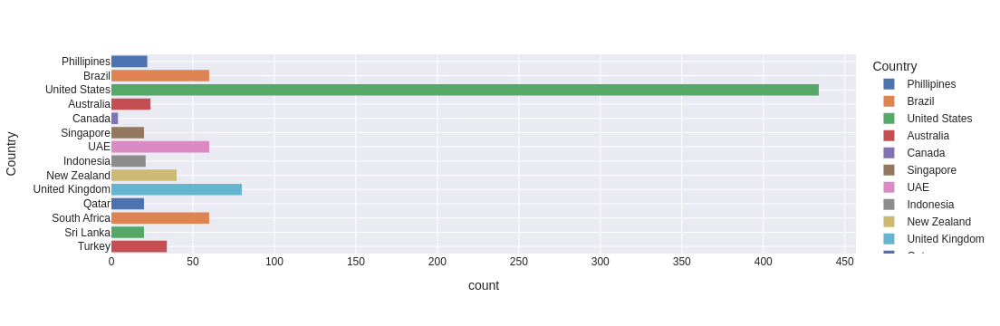

In [34]:
px.histogram(data_frame=df[df['Country']!='India'], y='Country',color='Country',template='seaborn')

<p style="font-size:140%;color:#f941ff">There are samples from India and USA like a huge percentage of the samples .There are 8652 from India and around 434 from USA. Around 95% of the samples are from these two countries only.</p>

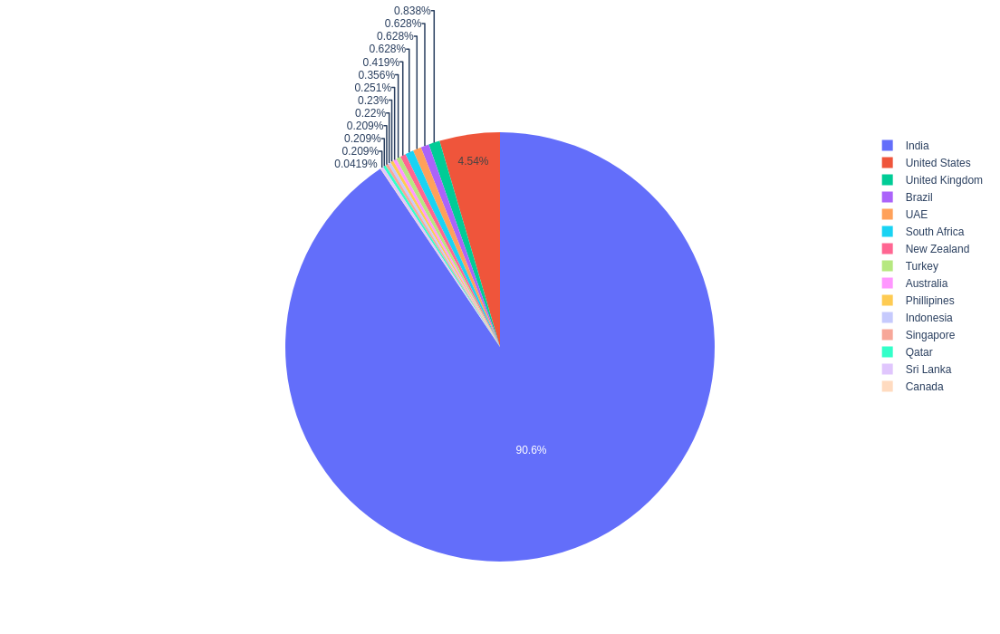

In [35]:
px.pie(data_frame=df, names='Country', width=500, height=700)

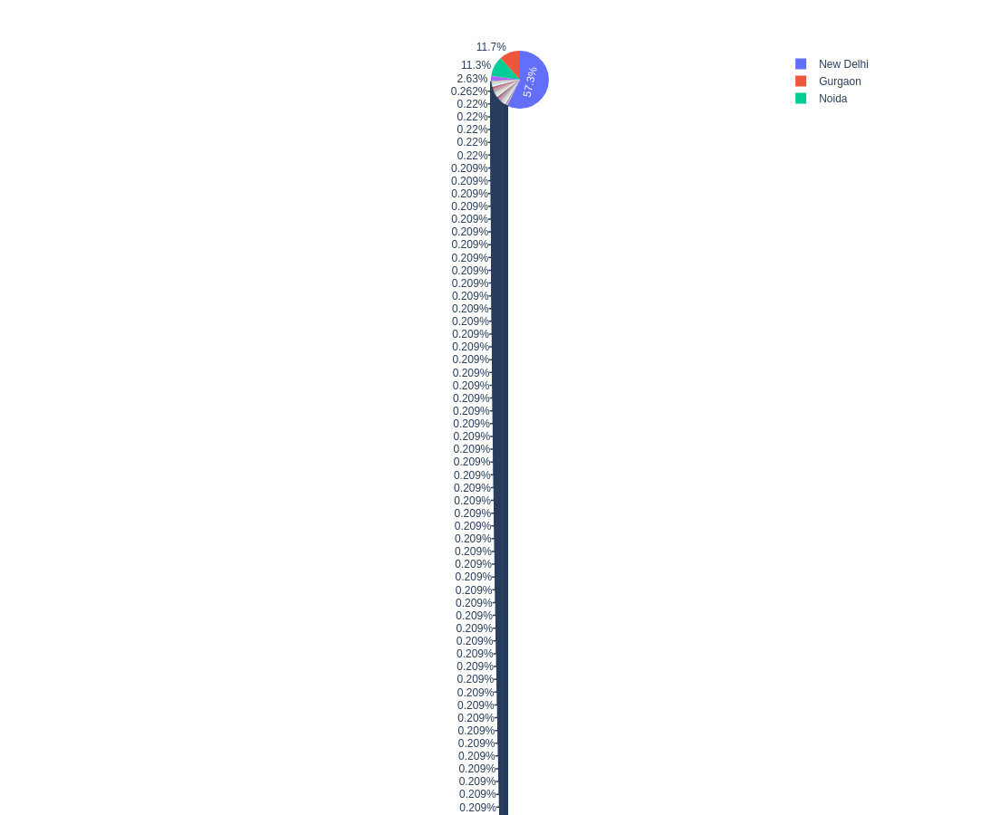

In [36]:
px.pie(data_frame=df, names='City', width=900, height=900)

In [37]:
df['City'].value_counts()

City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
                ... 
Huskisson          1
Panchkula          1
Forrest            1
Flaxton            1
Chatham-Kent       1
Name: count, Length: 141, dtype: int64

<p style="font-size:140%;color:#6a3dff">57.3% of the samples belong to New Delhi City, 11.7% from GURGAON, 11.7% from Noida. These 3 cities which are geographically very close to each other have like 71% of the total samples of restaurants.</p>

In [38]:
df['City'].unique()

array(['Makati City', 'Mandaluyong City', 'Pasay City', 'Pasig City',
       'Quezon City', 'San Juan City', 'Santa Rosa', 'Tagaytay City',
       'Taguig City', 'Brasí_lia', 'Rio de Janeiro', 'Sí£o Paulo',
       'Albany', 'Athens', 'Augusta', 'Boise', 'Cedar Rapids/Iowa City',
       'Clatskanie', 'Cochrane', 'Columbus', 'Dalton', 'Davenport',
       'Des Moines', 'Dubuque', 'Fernley', 'Gainesville', 'Lakeview',
       'Lincoln', 'Macon', 'Mc Millan', 'Miller', 'Monroe',
       'Ojo Caliente', 'Orlando', 'Pensacola', 'Pocatello', 'Potrero',
       'Princeton', 'Rest of Hawaii', 'Savannah', 'Sioux City',
       'Tampa Bay', 'Valdosta', 'Vernonia', 'Waterloo', 'Weirton',
       'Winchester Bay', 'Armidale', 'Balingup', 'Beechworth',
       'Dicky Beach', 'East Ballina', 'Flaxton', 'Forrest',
       'Hepburn Springs', 'Huskisson', 'Inverloch', 'Lakes Entrance',
       'Lorn', 'Macedon', 'Mayfield', 'Middleton Beach', 'Montville',
       'Palm Cove', 'Paynesville', 'Penola', 'Phillip Isl

In [39]:
df['City'].nunique()

141

<Axes: xlabel='Has Table booking', ylabel='count'>

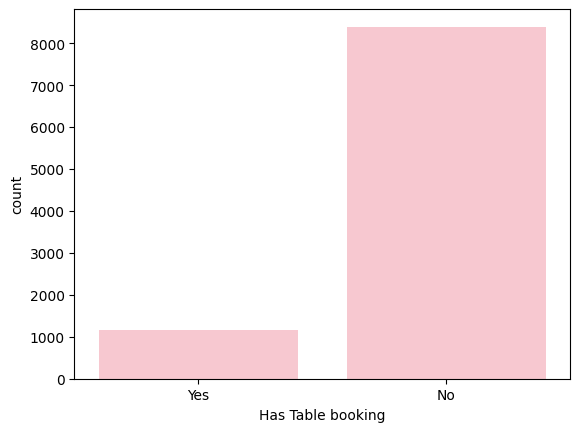

In [40]:
sns.countplot(data=df, x='Has Table booking', color='pink')

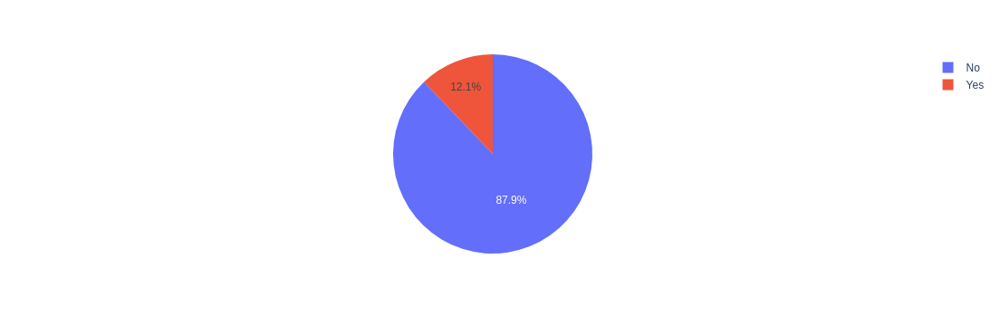

In [41]:
px.pie(data_frame=df, names='Has Table booking')

<Axes: xlabel='Has Online delivery', ylabel='count'>

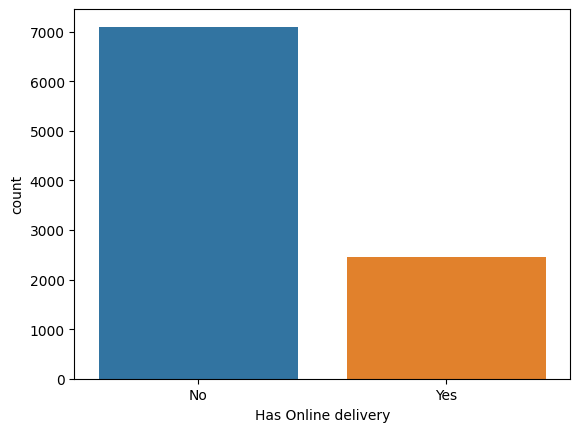

In [42]:
sns.countplot(data=df, x= 'Has Online delivery',palette='tab10')

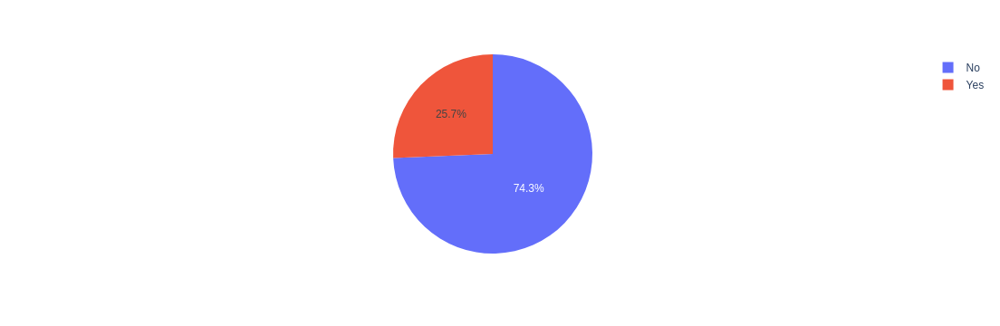

In [43]:
px.pie(data_frame=df, names= 'Has Online delivery',)

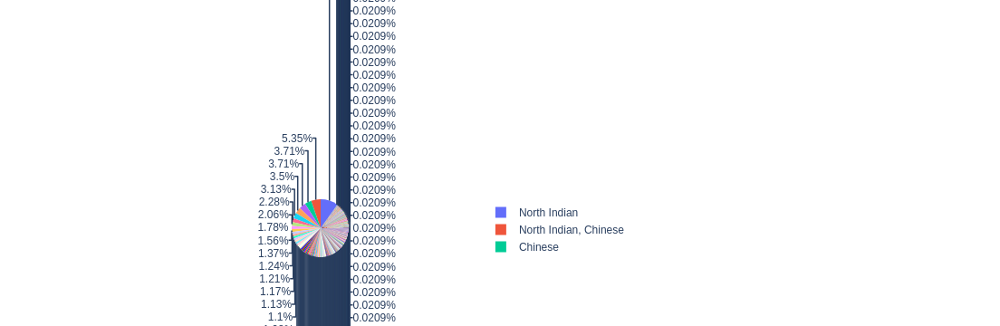

In [44]:
px.pie(data_frame=df, names='Cuisines')

In [45]:
df['Cuisines'].nunique()

1825

In [46]:
df['Cuisines'].value_counts()

Cuisines
North Indian                                             936
North Indian, Chinese                                    511
Chinese                                                  354
Fast Food                                                354
North Indian, Mughlai                                    334
                                                        ... 
Bengali, Fast Food                                         1
North Indian, Rajasthani, Asian                            1
Chinese, Thai, Malaysian, Indonesian                       1
Bakery, Desserts, North Indian, Bengali, South Indian      1
Italian, World Cuisine                                     1
Name: count, Length: 1825, dtype: int64

In [47]:
df['Locality'].nunique()

1208

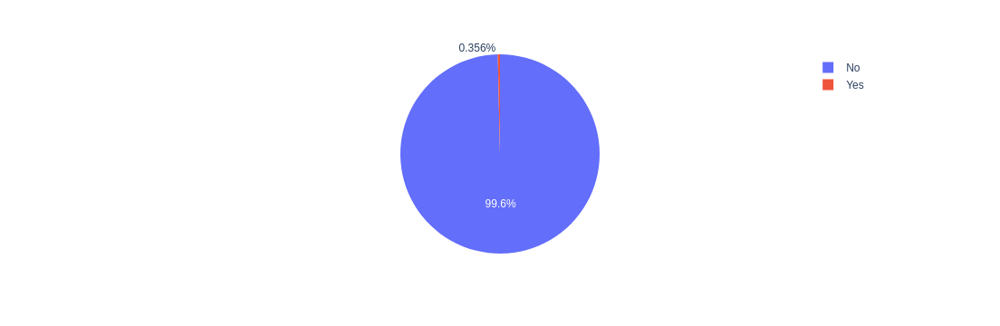

In [48]:
px.pie(data_frame=df, names= 'Is delivering now',)

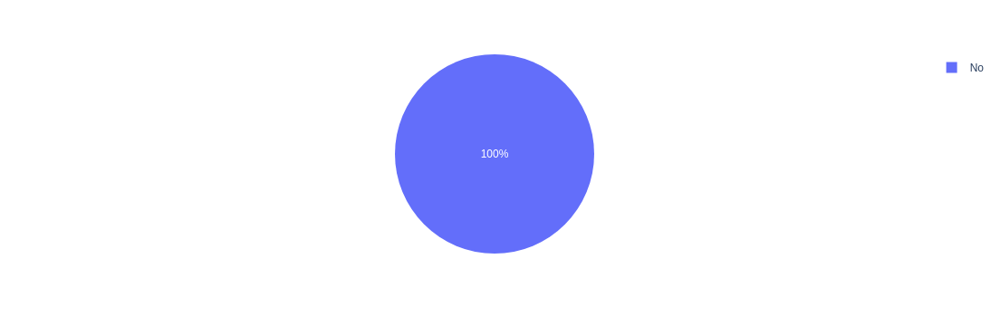

In [49]:
px.pie(data_frame=df, names= 'Switch to order menu',)

<p style="font-size:140%;color:#4965ca">IS DELIVERING NOW AND SWITCH TO ORDER MENU ARE BASICALLY USELESS AS ALMOST 100% VALUES ARE NO IN BOTH COLUMNS.</p>

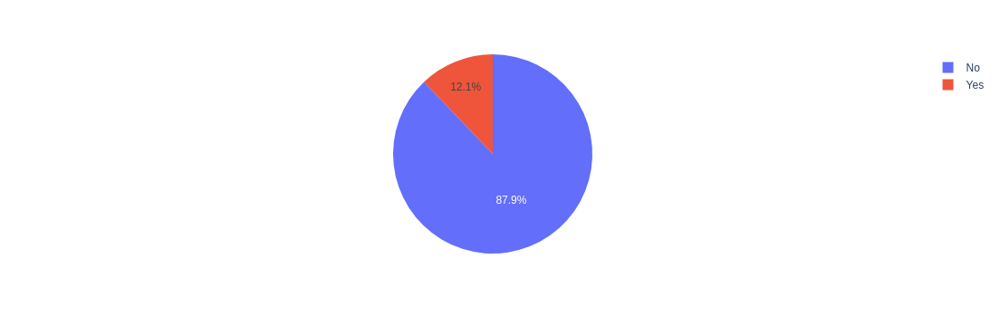

In [50]:
px.pie(data_frame=df, names= 'Has Table booking',)

<Axes: xlabel='Has Table booking', ylabel='count'>

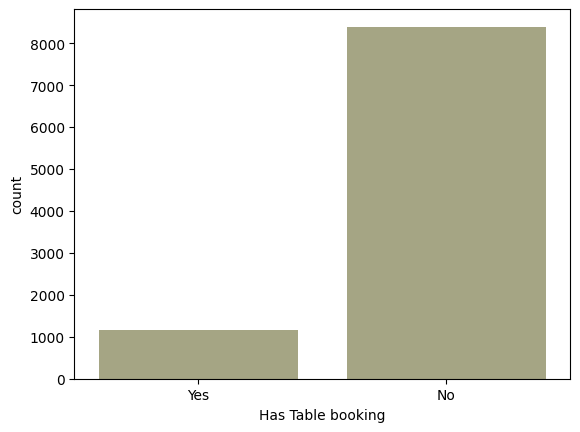

In [51]:
sns.countplot(data=df, x='Has Table booking', color='#aaaa7f')

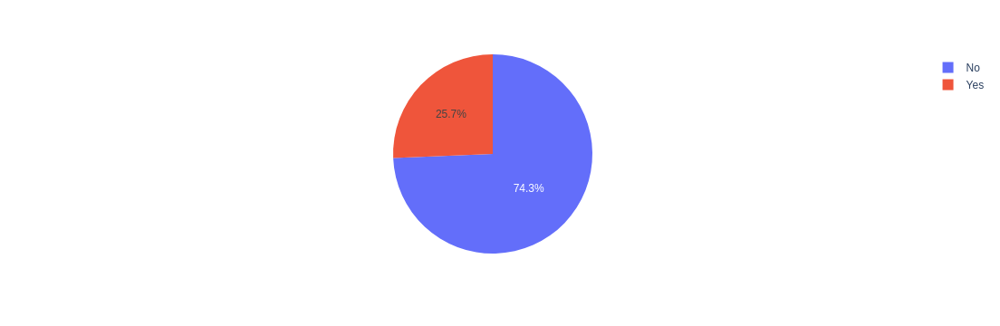

In [52]:
px.pie(data_frame=df, names='Has Online delivery')

<Axes: xlabel='Has Online delivery', ylabel='count'>

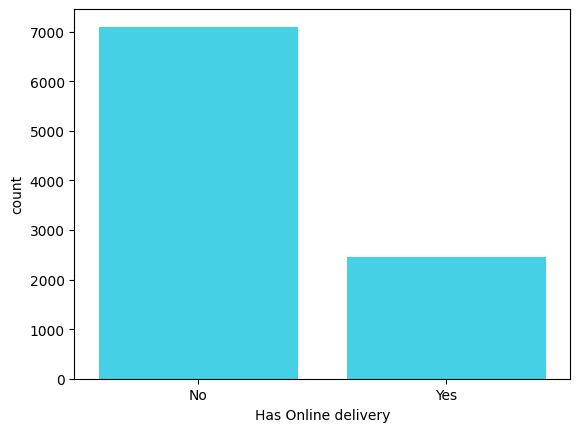

In [53]:
sns.countplot(data=df, x='Has Online delivery', color='#2be3ff')

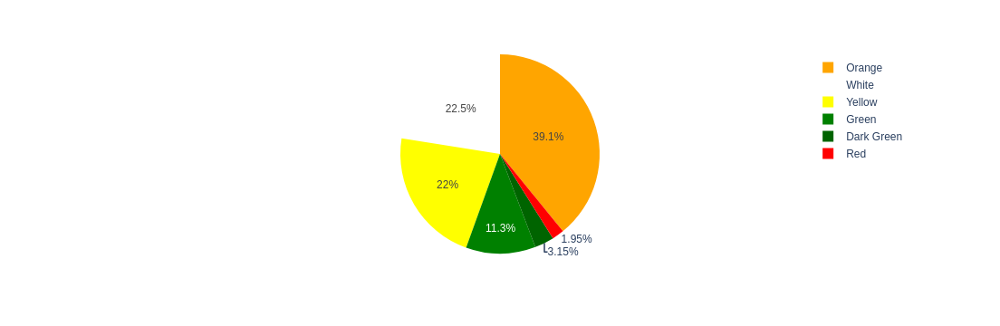

In [54]:
px.pie(data_frame=df, names= 'Rating color',color_discrete_sequence=['orange', 'white','yellow', 'green', 'darkgreen','red'])

<Axes: xlabel='Rating color', ylabel='count'>

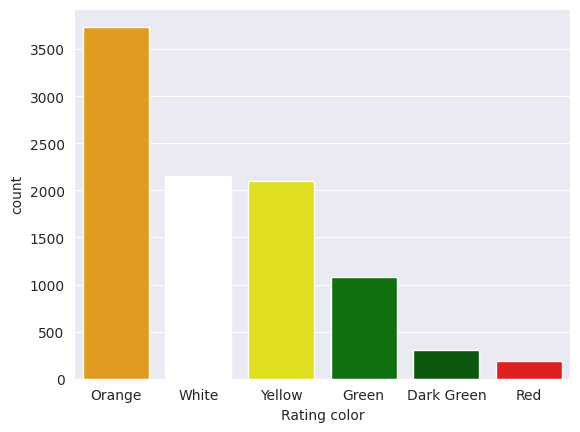

In [55]:
sns.set_style('darkgrid')
sns.countplot(data=df, x= 'Rating color', palette=['orange', 'white','yellow', 'green', 'darkgreen','red'],order=df['Rating color'].value_counts().index)

<Axes: xlabel='Rating text', ylabel='count'>

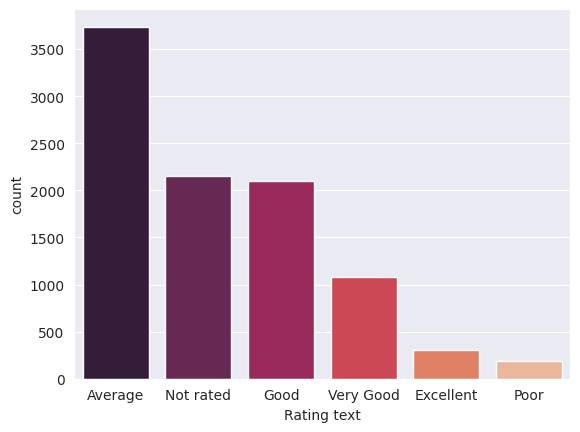

In [56]:
sns.countplot(data=df, x= 'Rating text', palette='rocket',order=df['Rating text'].value_counts().index)

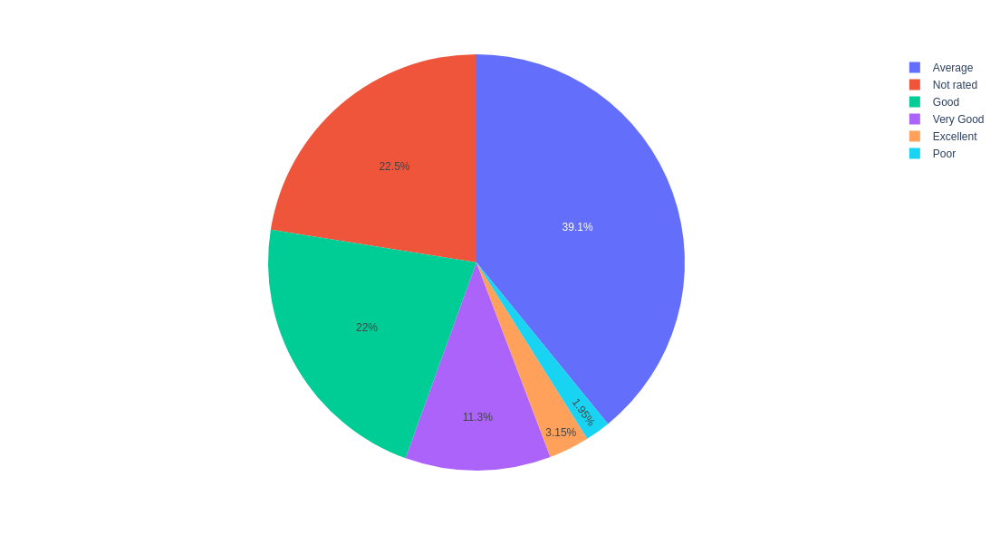

In [57]:
px.pie(data_frame=df, names='Rating text', width=600, height=600)

<p style="font-size:140%;color:#df800c">Rating color and Rating text are same the average rating gets orange rating, very good and excellent rating gets green color respectively. poor rating gets red color in the next columns respectively.So, we can clearly see that these two columns have very high co-relation.</p>

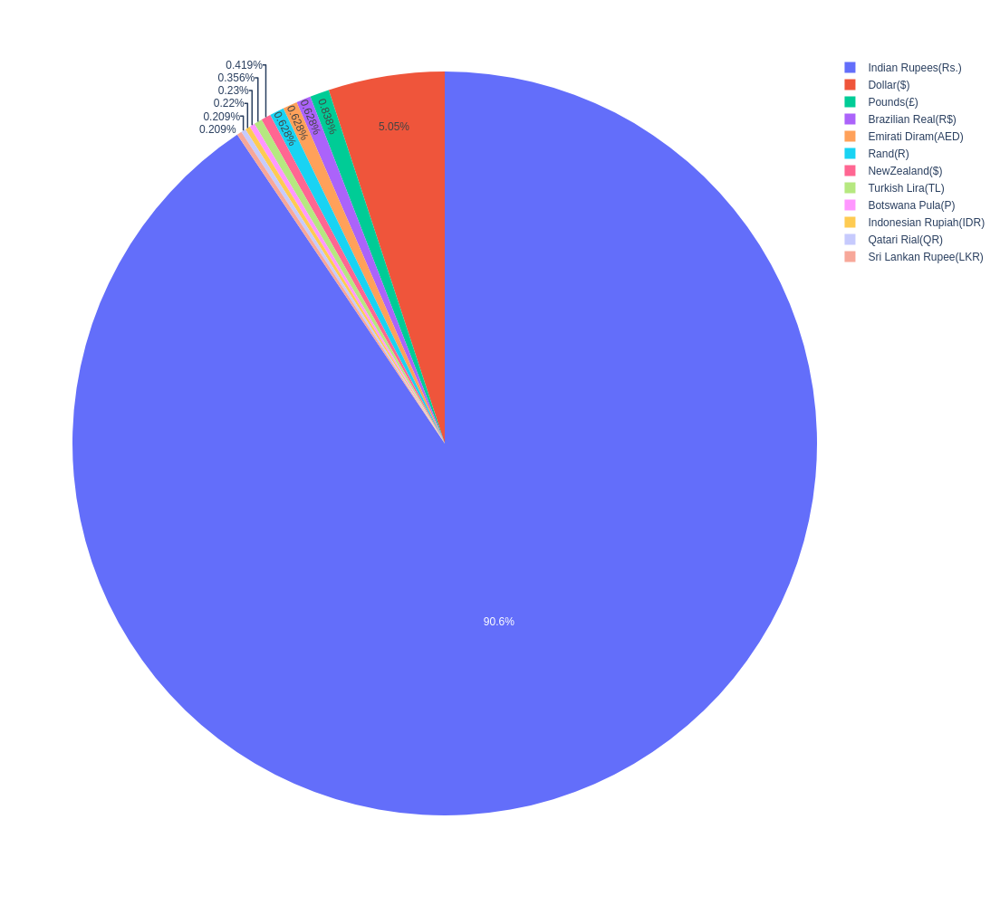

In [58]:
px.pie(data_frame=df, names='Currency', width=1000, height=1000)

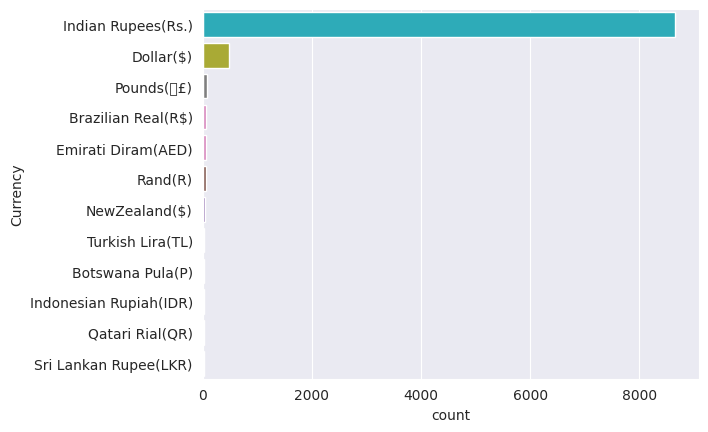

In [59]:
sns.countplot(data=df, y='Currency',palette='tab10_r',order=df['Currency'].value_counts().index)
plt.show()

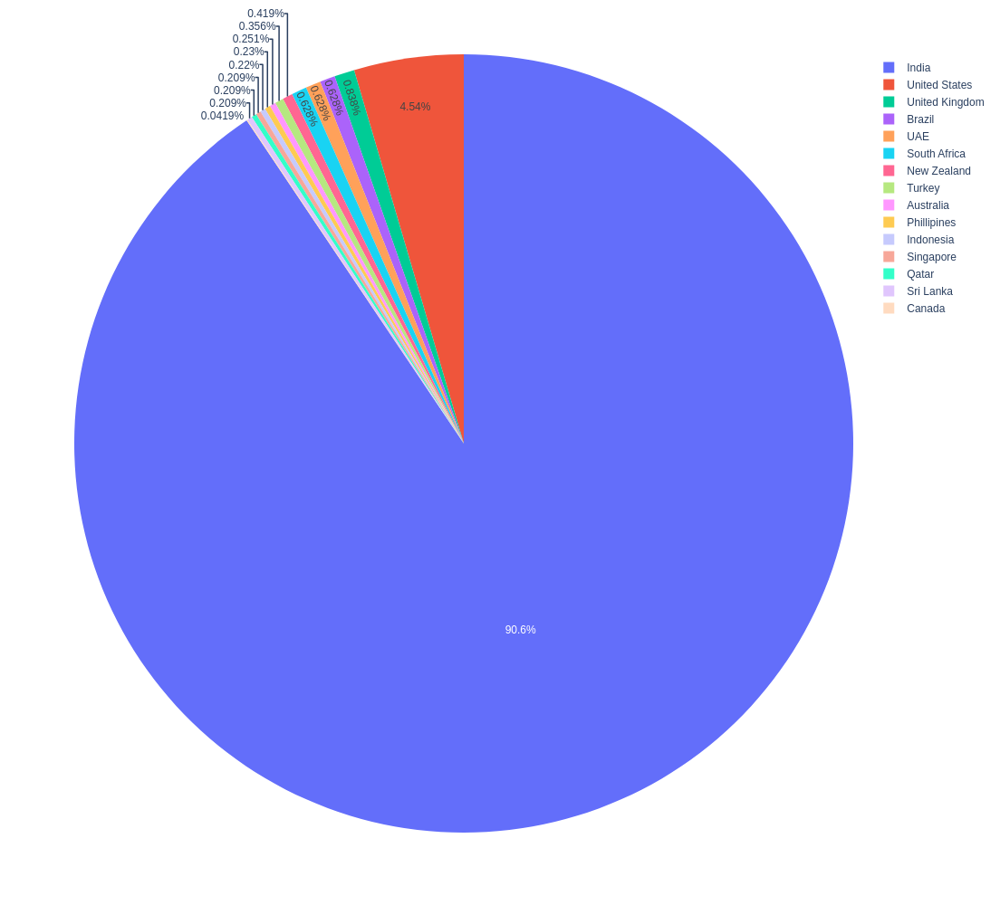

In [60]:
px.pie(data_frame=df, names='Country', width=1000, height=1000)

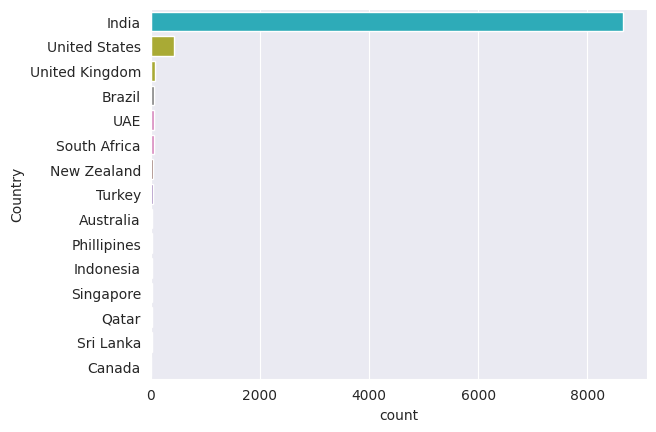

In [61]:
sns.countplot(data=df, y='Country',palette='tab10_r',order=df['Country'].value_counts().index)
plt.show()

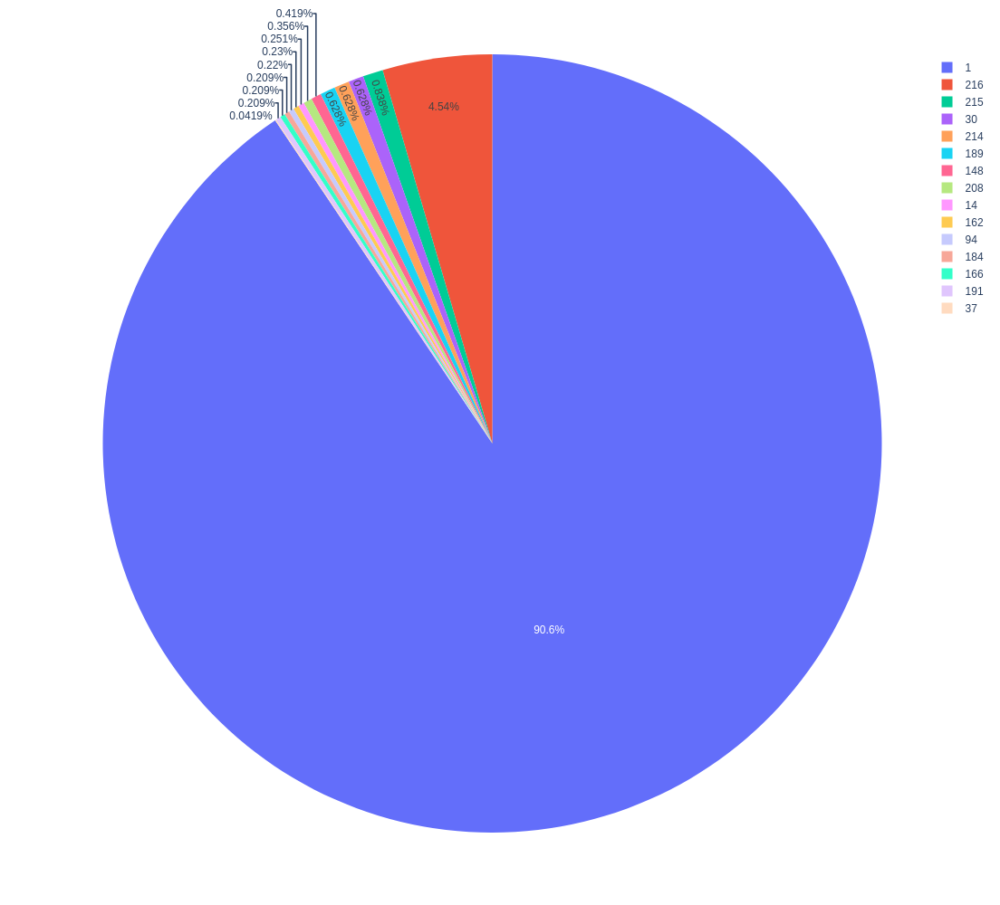

In [62]:
px.pie(data_frame=df, names='Country Code', width=1000, height=1000)

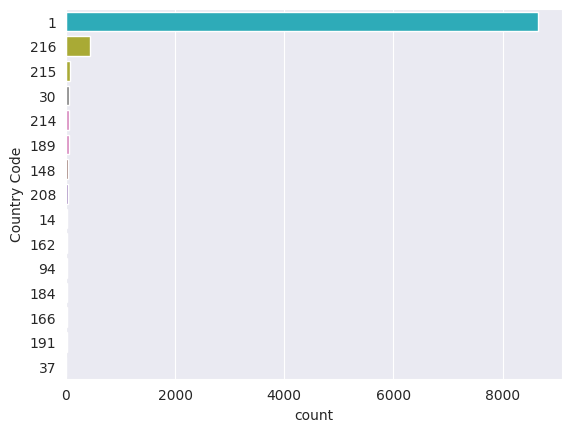

In [63]:
sns.countplot(data=df, y='Country Code',palette='tab10_r',order=df['Country Code'].value_counts().index)
plt.show()

<p style="font-size:140%;color:#df0e0e">Country and Currency are highly corelated almost 95% the only difference being United States and New Zealand have the "$" currency.</p>

In [64]:
df.corr(numeric_only=True)

,Restaurant ID,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
Restaurant ID,1.000000,0.148471,-0.226081,-0.052081,-0.001693,-0.134540,-0.326212,-0.147023
Country Code,0.148471,1.000000,-0.698299,0.019792,0.043225,0.243327,0.282189,0.154530
Longitude,-0.226081,-0.698299,1.000000,0.043207,0.045891,-0.078939,-0.116818,-0.085101
Latitude,-0.052081,0.019792,0.043207,1.000000,-0.111088,-0.166688,0.000516,-0.022962
Average Cost for two,-0.001693,0.043225,0.045891,-0.111088,1.000000,0.075083,0.051792,0.067783
Price range,-0.134540,0.243327,-0.078939,-0.166688,0.075083,1.000000,0.437944,0.309444
Aggregate rating,-0.326212,0.282189,-0.116818,0.000516,0.051792,0.437944,1.000000,0.313691
Votes,-0.147023,0.154530,-0.085101,-0.022962,0.067783,0.309444,0.313691,1.000000


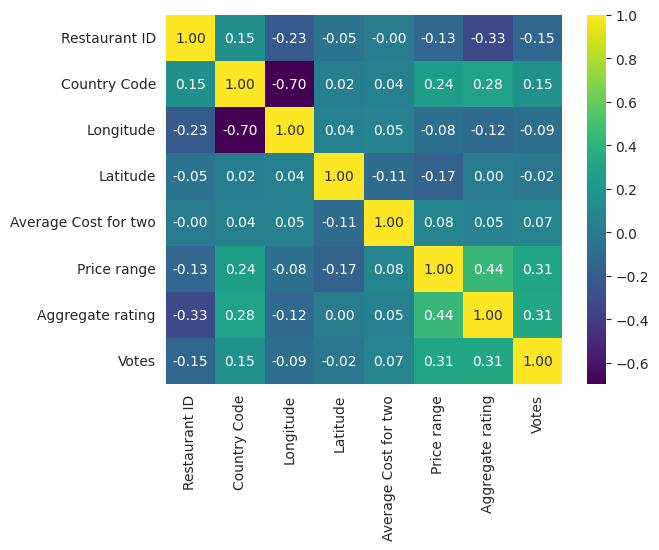

In [65]:
sns.heatmap(data=df.corr(numeric_only=True),annot=True, fmt='0.2f', cmap='viridis')
plt.show()

In [66]:
import wordcloud

In [67]:
text = df['Cuisines'].values

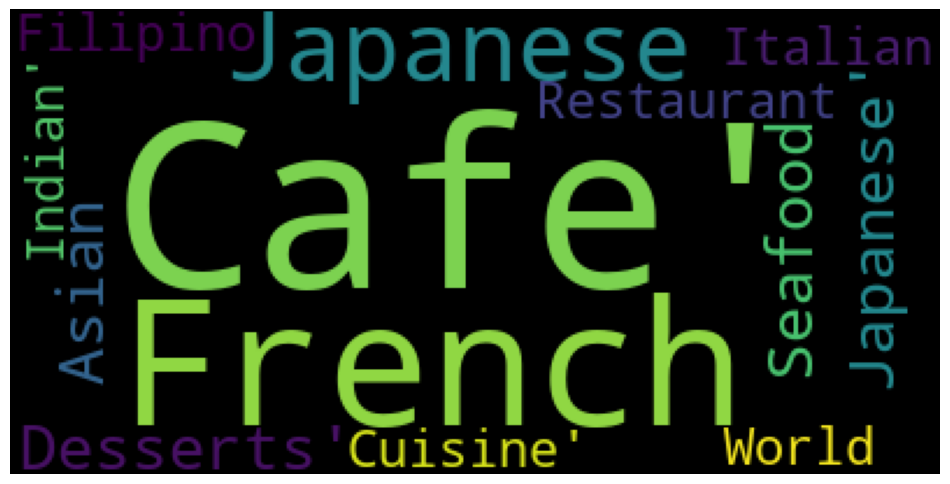

In [68]:
words = wordcloud.WordCloud().generate(str(text))
plt.figure(figsize=(12,8))
plt.imshow(words)
plt.axis('off')
plt.show()

<p style="font-size:140%;color:red">The most used words or popular cuisines available in most restaurants are Japanese, French, Cafe, Indian, Seafood and many other cuisines.</p>

<h2 style="color:#c7c700">BARPLOTS BY DIFFERENT COLUMNS ⤵️</h2>

In [69]:
df.groupby(by='Country')['Aggregate rating'].mean()

Country
Australia         3.658333
Brazil            3.763333
Canada            3.575000
India             2.523324
Indonesia         4.295238
New Zealand       4.262500
Phillipines       4.468182
Qatar             4.060000
Singapore         3.575000
South Africa      4.210000
Sri Lanka         3.870000
Turkey            4.300000
UAE               4.233333
United Kingdom    4.087500
United States     4.004378
Name: Aggregate rating, dtype: float64

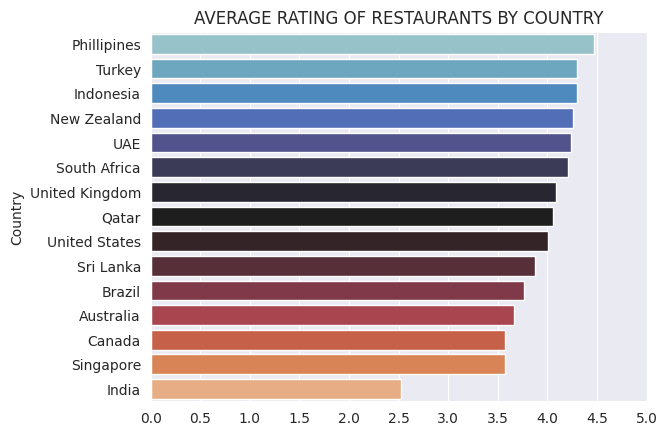

In [70]:
sns.barplot(x=df.groupby(by='Country')['Aggregate rating'].mean().sort_values(ascending=False).values,
            y=df.groupby(by='Country')['Aggregate rating'].mean().sort_values(ascending=False).index,
            palette='icefire',)
plt.title('AVERAGE RATING OF RESTAURANTS BY COUNTRY')
plt.xticks(np.linspace(0.0,5.0,11))
plt.show()

<p style="font-size:140%;color:#0c1fcc">Phillipines has the best mean aggregate rating on Zomato App which is 4.4 and India has the worst with an average of 2.5 rating on the app.</h2>

In [71]:
df.groupby(by='Rating text')['Average Cost for two'].mean()

Rating text
Average       568.328873
Excellent    8136.611296
Good         1044.791429
Not rated     340.337523
Poor          637.876344
Very Good    3556.019462
Name: Average Cost for two, dtype: float64

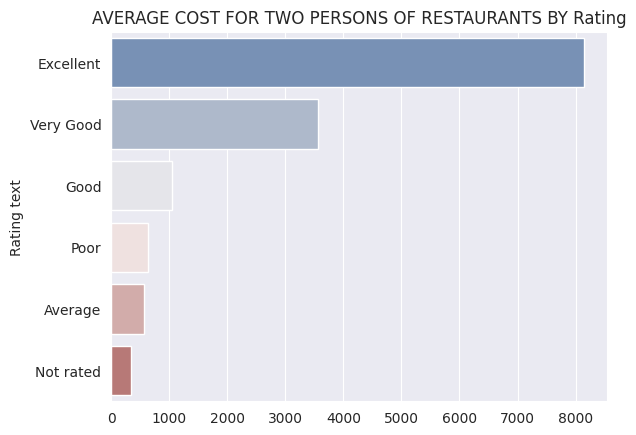

In [72]:
sns.barplot(x=df.groupby(by='Rating text')['Average Cost for two'].mean().sort_values(ascending=False).values,
            y=df.groupby(by='Rating text')['Average Cost for two'].mean().sort_values(ascending=False).index,
            palette='vlag',)
plt.title('AVERAGE COST FOR TWO PERSONS OF RESTAURANTS BY Rating')
plt.show()

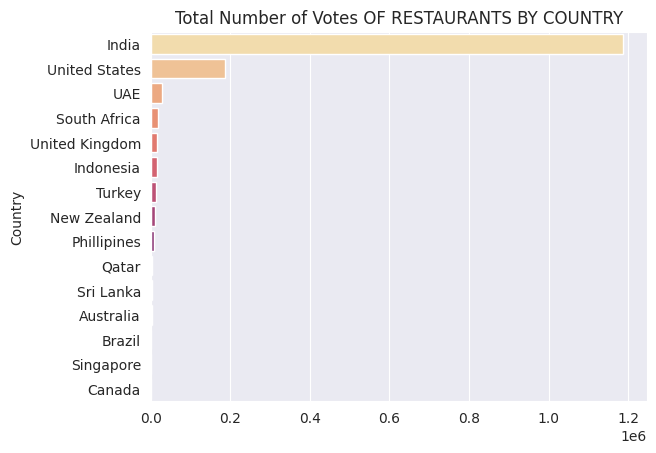

In [73]:
sns.barplot(x=df.groupby(by='Country')['Votes'].sum().sort_values(ascending=False).values,
            y=df.groupby(by='Country')['Votes'].sum().sort_values(ascending=False).index,
            palette='magma_r',)
plt.title('Total Number of Votes OF RESTAURANTS BY COUNTRY')
plt.show()

In [74]:
df['Currency'].value_counts()

Currency
Indian Rupees(Rs.)        8652
Dollar($)                  482
Pounds(£)                  80
Brazilian Real(R$)          60
Emirati Diram(AED)          60
Rand(R)                     60
NewZealand($)               40
Turkish Lira(TL)            34
Botswana Pula(P)            22
Indonesian Rupiah(IDR)      21
Qatari Rial(QR)             20
Sri Lankan Rupee(LKR)       20
Name: count, dtype: int64

<p style="font-size:140%;color:#801dc7">Important Information. We will create a new column for average cost for two (USD ) Dollar . This is because while using regression, we need to give the model values of one column should be of the same unit. In this case beacuse the money if different in different countries, we will convert the cost into USD $. I'm making this project in July 2024. So, if you are building this project from this notebook in the future. Please make sure to change currency converter. Also, we will stop using 'Average Cost for two' column and as we have to build two models one if regression and the other is multiclass classififcation, we will not give the two target variables to either of the model for training.</p>

In [75]:
def currency_coverter(x, y):
    if x=='Indian Rupees(Rs.)':
        return y*0.012
    elif x=='Dollar($)':
        return y
    elif x=='Pounds(£)':
        return y*1.29
    elif x=='Brazilian Real(R$)':
        return y*0.18
    elif x=='Emirati Diram(AED)':
        return y*0.27
    elif x=='Rand(R)':
        return y*0.055
    
    elif x=='NewZealand($)':
        return y*0.59
    elif x=='Turkish Lira(TL)':
        return y*0.030
    elif x=='Botswana Pula(P)':
        return y*0.074
    elif x=='Indonesian Rupiah(IDR)':
        return y*0.000062

    elif x=='Qatari Rial(QR)':
        return y*0.27
    elif x=='Sri Lankan Rupee(LKR)':
        return y*0.0033
    else:
        return y

In [76]:
df['AVERAGE COST FOR TWO IN (USD $)'] = df.apply(lambda x : currency_coverter(x['Currency'],x['Average Cost for two']), axis=1)
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country,AVERAGE COST FOR TWO IN (USD $)
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines,81.40
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines,88.80
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines,296.00
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines,111.00
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines,111.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788,Turkey,2.40
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034,Turkey,3.15
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661,Turkey,5.10
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901,Turkey,3.60


<p style="font-size:140%;color:#ffaa00">Now, we will use this new average cost of two in usd column for target variable, so our regression model will learn better if the price prediction column is in only one currency.</p>

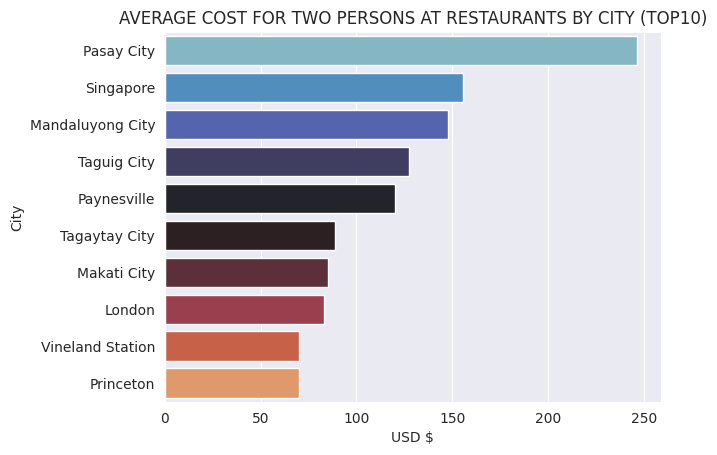

In [77]:
sns.barplot(x=df.groupby(by='City')['AVERAGE COST FOR TWO IN (USD $)'].mean().sort_values(ascending=False).iloc[:10].values,
            y=df.groupby(by='City')['AVERAGE COST FOR TWO IN (USD $)'].mean().sort_values(ascending=False).iloc[:10].index,
            palette='icefire',)
plt.title('AVERAGE COST FOR TWO PERSONS AT RESTAURANTS BY CITY (TOP10)')
plt.xlabel('USD $')
plt.show()

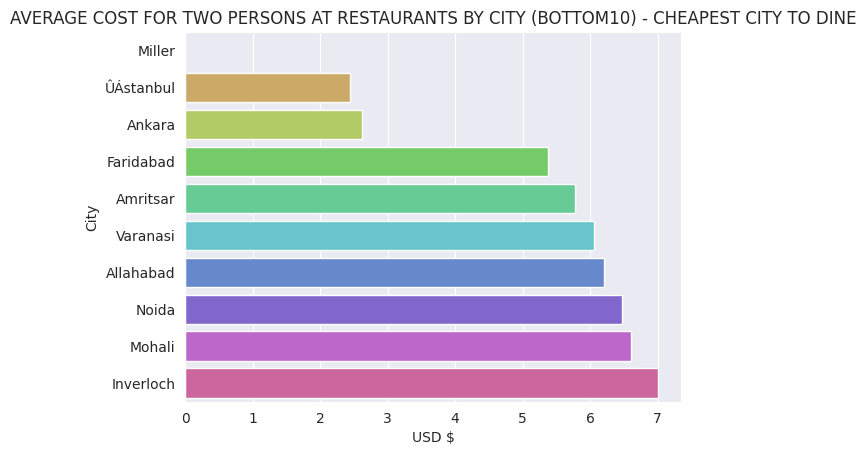

In [78]:
sns.barplot(x=df.groupby(by='City')['AVERAGE COST FOR TWO IN (USD $)'].mean().sort_values(ascending=True).iloc[:10].values,
            y=df.groupby(by='City')['AVERAGE COST FOR TWO IN (USD $)'].mean().sort_values(ascending=True).iloc[:10].index,
            palette='hls',)
plt.title('AVERAGE COST FOR TWO PERSONS AT RESTAURANTS BY CITY (BOTTOM10) - CHEAPEST CITY TO DINE')
plt.xlabel('USD $')
plt.show()

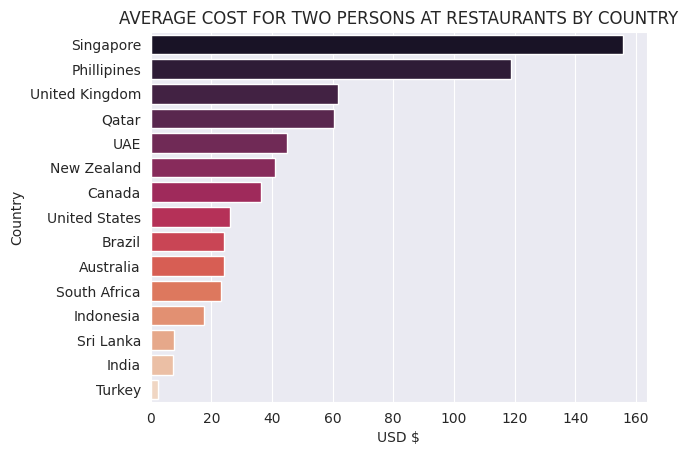

In [79]:
sns.barplot(x=df.groupby(by='Country')['AVERAGE COST FOR TWO IN (USD $)'].mean().sort_values(ascending=False).values,
            y=df.groupby(by='Country')['AVERAGE COST FOR TWO IN (USD $)'].mean().sort_values(ascending=False).index,
            palette='rocket',)
plt.title('AVERAGE COST FOR TWO PERSONS AT RESTAURANTS BY COUNTRY')
plt.xlabel('USD $')
plt.show()

<p style="font-size:140%;color:#c71521">Pasay City in Phillipines is the most expensive city around 240 dollars average cost and Singapore is the most expensive country with 155 dollars average cost of food whereas the cheapest city is Istanbul where cost is 2.5 $ on average for food according to zomato.</p>

<h4 style="color:#aaaaff">PANDAS CROSSTABS ⬇️</h4>

In [80]:
pd.crosstab(index=df['Country'], columns=df['Price range'])

Price range,1,2,3,4
Country,,,,
Australia,4,14,5,1
Brazil,2,7,16,35
Canada,0,3,0,1
India,4295,2858,1111,388
Indonesia,0,1,20,0
New Zealand,3,4,17,16
Phillipines,0,1,12,9
Qatar,0,1,5,14
Singapore,0,1,5,14


In [81]:
pd.crosstab(index=df['Rating text'], columns=df['Price range'])

Price range,1,2,3,4
Rating text,,,,
Average,1898,1425,313,101
Excellent,32,69,126,74
Good,608,794,498,200
Not rated,1700,402,35,11
Poor,62,98,20,6
Very Good,144,325,416,194


In [82]:
pd.crosstab(index=df['Has Table booking'], columns=df['Price range'])

Price range,1,2,3,4
Has Table booking,,,,
No,4443,2874,764,312
Yes,1,239,644,274


<Axes: xlabel='Price range', ylabel='count'>

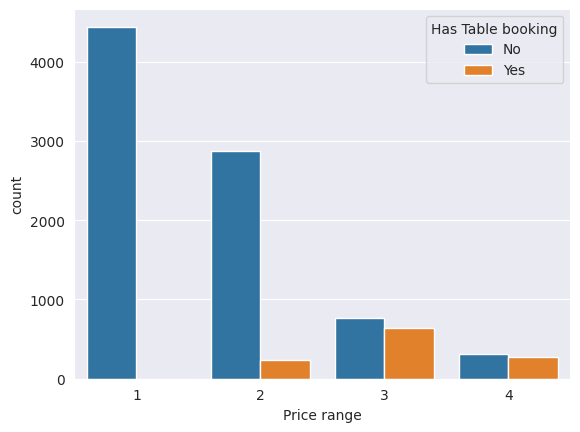

In [83]:
sns.countplot(data=df, x='Price range', hue='Has Table booking')

In [84]:
pd.crosstab(index=df['Has Online delivery'], columns=df['Price range'])

Price range,1,2,3,4
Has Online delivery,,,,
No,3743,1827,997,533
Yes,701,1286,411,53


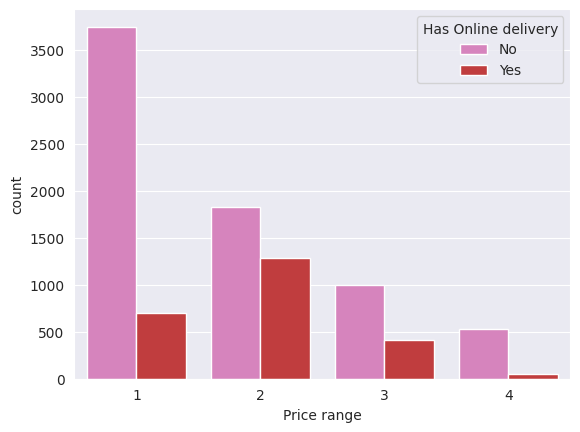

In [85]:
sns.countplot(data=df, x='Price range', hue='Has Online delivery', palette='tab10_r')
plt.show()

<h4 style="color:#550000">SWARMPLOT ⬇️</h4>

<Axes: xlabel='Price range', ylabel='Aggregate rating'>

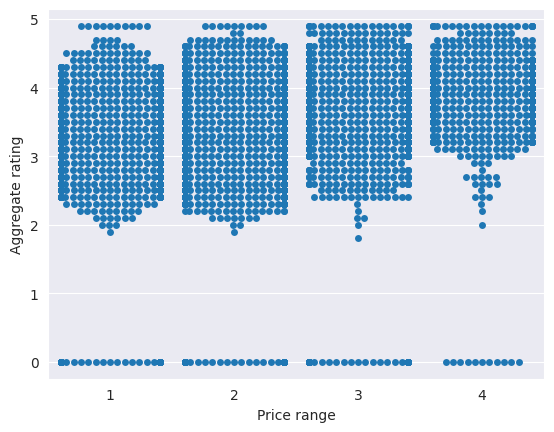

In [86]:
sns.swarmplot(data=df, x='Price range', y='Aggregate rating')

In [87]:
df.isnull().sum().sum()

9

<h2 style="color:maroon">FEATURE ENGINEERING ⤵️</h2>

In [88]:
from sklearn.impute import SimpleImputer

In [89]:
si = SimpleImputer(strategy='most_frequent')

In [90]:
df[['Cuisines']] = si.fit_transform(df[['Cuisines']])

In [91]:
df.isnull().sum().sum()

0

<p style="font-size:140%;color:blue">There are zero null values now and now we will create a 20 new columns of different cuisines which are very popular and these column values will be binary i.e 1 if that cuisine is available in that restaurant and 0 if not</p>

In [92]:
data1 = df.groupby(by='City')['Average Cost for two'].mean().reset_index()
data1

,City,Average Cost for two
0,Abu Dhabi,182.000000
1,Agra,1065.000000
2,Ahmedabad,857.142857
3,Albany,19.750000
4,Allahabad,517.500000
...,...,...
136,Weirton,25.000000
137,Wellington City,71.250000
138,Winchester Bay,25.000000
139,Yorkton,25.000000


In [93]:
df = df.merge(data1, on='City')
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two_x,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country,AVERAGE COST FOR TWO IN (USD $),Average Cost for two_y
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines,81.40,1150.000000
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines,88.80,1150.000000
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines,296.00,2000.000000
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines,111.00,2000.000000
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines,111.00,2000.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788,Turkey,2.40,81.428571
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034,Turkey,3.15,81.428571
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661,Turkey,5.10,81.428571
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901,Turkey,3.60,81.428571


In [94]:
data2 =  df.groupby(by='Country')['Average Cost for two_x'].mean().reset_index()
data2

,Country,Average Cost for two_x
0,Australia,24.083333
1,Brazil,134.666667
2,Canada,36.250000
3,India,623.370319
4,Indonesia,281190.476190
5,New Zealand,69.750000
6,Phillipines,1606.818182
7,Qatar,223.750000
8,Singapore,155.750000
9,South Africa,419.733333


In [95]:
df = df.merge(data2, on='Country')

In [96]:
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two_x_x,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country,AVERAGE COST FOR TWO IN (USD $),Average Cost for two_y,Average Cost for two_x_y
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines,81.40,1150.000000,1606.818182
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines,88.80,1150.000000,1606.818182
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines,296.00,2000.000000,1606.818182
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines,111.00,2000.000000,1606.818182
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines,111.00,2000.000000,1606.818182
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788,Turkey,2.40,81.428571,84.852941
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034,Turkey,3.15,81.428571,84.852941
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661,Turkey,5.10,81.428571,84.852941
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901,Turkey,3.60,81.428571,84.852941


In [97]:
df.rename(columns={'Average Cost for two_x_x':'Average Cost for two',
                  'Average Cost for two_y':'Mean Cost by City',
                  'Average Cost for two_x_y':'Mean Cost by Country'},inplace=True)
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country,AVERAGE COST FOR TWO IN (USD $),Mean Cost by City,Mean Cost by Country
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines,81.40,1150.000000,1606.818182
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines,88.80,1150.000000,1606.818182
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines,296.00,2000.000000,1606.818182
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines,111.00,2000.000000,1606.818182
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines,111.00,2000.000000,1606.818182
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788,Turkey,2.40,81.428571,84.852941
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034,Turkey,3.15,81.428571,84.852941
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661,Turkey,5.10,81.428571,84.852941
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901,Turkey,3.60,81.428571,84.852941


In [98]:
data3 =  df.groupby(by='City')['Aggregate rating'].mean().reset_index()
data3

,City,Aggregate rating
0,Abu Dhabi,4.300000
1,Agra,3.965000
2,Ahmedabad,4.161905
3,Albany,3.555000
4,Allahabad,3.395000
...,...,...
136,Weirton,3.900000
137,Wellington City,4.250000
138,Winchester Bay,3.200000
139,Yorkton,3.300000


In [99]:
df = df.merge(data3, on='City')
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating_x,Rating color,Rating text,Votes,Country,AVERAGE COST FOR TWO IN (USD $),Mean Cost by City,Mean Cost by Country,Aggregate rating_y
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines,81.40,1150.000000,1606.818182,4.650000
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines,88.80,1150.000000,1606.818182,4.650000
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines,296.00,2000.000000,1606.818182,4.625000
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines,111.00,2000.000000,1606.818182,4.625000
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines,111.00,2000.000000,1606.818182,4.625000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788,Turkey,2.40,81.428571,84.852941,4.292857
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034,Turkey,3.15,81.428571,84.852941,4.292857
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661,Turkey,5.10,81.428571,84.852941,4.292857
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901,Turkey,3.60,81.428571,84.852941,4.292857


In [100]:
df.rename(columns={'Aggregate rating_x':'Aggregate rating',
                  'Aggregate rating_y':'Mean aggregate rating ny City'},inplace=True)
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country,AVERAGE COST FOR TWO IN (USD $),Mean Cost by City,Mean Cost by Country,Mean aggregate rating ny City
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines,81.40,1150.000000,1606.818182,4.650000
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines,88.80,1150.000000,1606.818182,4.650000
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines,296.00,2000.000000,1606.818182,4.625000
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines,111.00,2000.000000,1606.818182,4.625000
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines,111.00,2000.000000,1606.818182,4.625000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788,Turkey,2.40,81.428571,84.852941,4.292857
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034,Turkey,3.15,81.428571,84.852941,4.292857
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661,Turkey,5.10,81.428571,84.852941,4.292857
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901,Turkey,3.60,81.428571,84.852941,4.292857


In [101]:
data4 =  df.groupby(by='City')['Votes'].mean().reset_index()
data4

,City,Votes
0,Abu Dhabi,302.250000
1,Agra,103.100000
2,Ahmedabad,584.095238
3,Albany,83.800000
4,Allahabad,69.600000
...,...,...
136,Weirton,156.000000
137,Wellington City,146.300000
138,Winchester Bay,16.000000
139,Yorkton,26.000000


In [102]:
df = df.merge(data4, on='City')
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes_x,Country,AVERAGE COST FOR TWO IN (USD $),Mean Cost by City,Mean Cost by Country,Mean aggregate rating ny City,Votes_y
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines,81.40,1150.000000,1606.818182,4.650000,452.500000
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines,88.80,1150.000000,1606.818182,4.650000,452.500000
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines,296.00,2000.000000,1606.818182,4.625000,300.000000
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines,111.00,2000.000000,1606.818182,4.625000,300.000000
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines,111.00,2000.000000,1606.818182,4.625000,300.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788,Turkey,2.40,81.428571,84.852941,4.292857,860.214286
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034,Turkey,3.15,81.428571,84.852941,4.292857,860.214286
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661,Turkey,5.10,81.428571,84.852941,4.292857,860.214286
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901,Turkey,3.60,81.428571,84.852941,4.292857,860.214286


In [103]:
df.rename(columns={"Votes_x":'Votes', 'Votes_y':'Mean Votes by City'},inplace=True)
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country,AVERAGE COST FOR TWO IN (USD $),Mean Cost by City,Mean Cost by Country,Mean aggregate rating ny City,Mean Votes by City
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines,81.40,1150.000000,1606.818182,4.650000,452.500000
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines,88.80,1150.000000,1606.818182,4.650000,452.500000
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines,296.00,2000.000000,1606.818182,4.625000,300.000000
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines,111.00,2000.000000,1606.818182,4.625000,300.000000
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines,111.00,2000.000000,1606.818182,4.625000,300.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788,Turkey,2.40,81.428571,84.852941,4.292857,860.214286
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034,Turkey,3.15,81.428571,84.852941,4.292857,860.214286
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661,Turkey,5.10,81.428571,84.852941,4.292857,860.214286
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901,Turkey,3.60,81.428571,84.852941,4.292857,860.214286


<p style="font-size:140%;color:#2dd046">Now, we created 4 new columns containing mean values of average cost for two people based on City, Country and the 3rd column we created contained mean values of Aggregate Rating by City. Finally, the 4th column contains mean votes by city.</p>

In [104]:
cuisine_list = ['North Indian', 'Chinese', 'Fast Food','Indian', 'Cafe', 'Desserts', 'Italian', 'South Indian', 
                'American', 'Asian', 'Filipino', 'Japanese', 'French', 'Mughlai']

In [105]:
for x in cuisine_list:
    df[x] = df['Cuisines'].astype('str').apply(lambda y: 1 if x in y else 0)
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country,AVERAGE COST FOR TWO IN (USD $),Mean Cost by City,Mean Cost by Country,Mean aggregate rating ny City,Mean Votes by City,North Indian,Chinese,Fast Food,Indian,Cafe,Desserts,Italian,South Indian,American,Asian,Filipino,Japanese,French,Mughlai
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314,Phillipines,81.40,1150.000000,1606.818182,4.650000,452.500000,0,0,0,0,0,1,0,0,0,0,0,1,1,0
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591,Phillipines,88.80,1150.000000,1606.818182,4.650000,452.500000,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270,Phillipines,296.00,2000.000000,1606.818182,4.625000,300.000000,0,0,0,1,0,0,0,0,0,1,1,0,0,0
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365,Phillipines,111.00,2000.000000,1606.818182,4.625000,300.000000,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229,Phillipines,111.00,2000.000000,1606.818182,4.625000,300.000000,0,0,0,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788,Turkey,2.40,81.428571,84.852941,4.292857,860.214286,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034,Turkey,3.15,81.428571,84.852941,4.292857,860.214286,0,0,0,0,1,0,0,0,0,0,0,0,0,0
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661,Turkey,5.10,81.428571,84.852941,4.292857,860.214286,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901,Turkey,3.60,81.428571,84.852941,4.292857,860.214286,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [106]:
from sklearn.preprocessing import PowerTransformer

In [107]:
power = PowerTransformer(method='yeo-johnson')

In [108]:
#We will remove skewness from Votes column with the help of yeo-johnson power transforming method

In [109]:
df[['Votes']] = power.fit_transform(df[['Votes']])
df

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes,Country,AVERAGE COST FOR TWO IN (USD $),Mean Cost by City,Mean Cost by Country,Mean aggregate rating ny City,Mean Votes by City,North Indian,Chinese,Fast Food,Indian,Cafe,Desserts,Italian,South Indian,American,Asian,Filipino,Japanese,French,Mughlai
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",1100,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,1.191885,Phillipines,81.40,1150.000000,1606.818182,4.650000,452.500000,0,0,0,0,0,1,0,0,0,0,0,1,1,0
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,1200,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,1.507786,Phillipines,88.80,1150.000000,1606.818182,4.650000,452.500000,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",4000,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,1.116765,Phillipines,296.00,2000.000000,1606.818182,4.625000,300.000000,0,0,0,1,0,0,0,0,0,1,1,0,0,0
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",1500,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,1.266889,Phillipines,111.00,2000.000000,1606.818182,4.625000,300.000000,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",1500,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,1.034953,Phillipines,111.00,2000.000000,1606.818182,4.625000,300.000000,0,0,0,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,NamlÛ± Gurme,208,ÛÁstanbul,"Kemankeô Karamustafa Paôa Mahallesi, RÛ±htÛ±...",Karakí_y,"Karakí_y, ÛÁstanbul",28.977392,41.022793,Turkish,80,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,1.652086,Turkey,2.40,81.428571,84.852941,4.292857,860.214286,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9547,5908749,Ceviz AÛôacÛ±,208,ÛÁstanbul,"Koôuyolu Mahallesi, Muhittin íìstí_ndaÛô Cadd...",Koôuyolu,"Koôuyolu, ÛÁstanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",105,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1.788687,Turkey,3.15,81.428571,84.852941,4.292857,860.214286,0,0,0,0,1,0,0,0,0,0,0,0,0,0
9548,5915807,Huqqa,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.034640,41.055817,"Italian, World Cuisine",170,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,1.563891,Turkey,5.10,81.428571,84.852941,4.292857,860.214286,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9549,5916112,Aôôk Kahve,208,ÛÁstanbul,"Kuruí_eôme Mahallesi, Muallim Naci Caddesi, N...",Kuruí_eôme,"Kuruí_eôme, ÛÁstanbul",29.036019,41.057979,Restaurant Cafe,120,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,1.719424,Turkey,3.60,81.428571,84.852941,4.292857,860.214286,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [110]:
for x in cat_cols:
    print(x,df[x].nunique())

Restaurant Name 7446
City 141
Address 8918
Locality 1208
Locality Verbose 1265
Cuisines 1825
Currency 12
Has Table booking 2
Has Online delivery 2
Is delivering now 2
Switch to order menu 1
Rating color 6
Rating text 6
Country 15


<p style="font-size:140%;color:cyan">Now, we have removed skewness from the Votes column.</p>

In [111]:
df.drop(['Restaurant ID', 'Restaurant Name','Country Code','Address', 'Locality','Locality Verbose'	,'Longitude', 'Latitude','Cuisines', 'Switch to order menu', 'Rating color'], axis=1, inplace=True)
df

,City,Average Cost for two,Currency,Has Table booking,Has Online delivery,Is delivering now,Price range,Aggregate rating,Rating text,Votes,Country,AVERAGE COST FOR TWO IN (USD $),Mean Cost by City,Mean Cost by Country,Mean aggregate rating ny City,Mean Votes by City,North Indian,Chinese,Fast Food,Indian,Cafe,Desserts,Italian,South Indian,American,Asian,Filipino,Japanese,French,Mughlai
0,Makati City,1100,Botswana Pula(P),Yes,No,No,3,4.8,Excellent,1.191885,Phillipines,81.40,1150.000000,1606.818182,4.650000,452.500000,0,0,0,0,0,1,0,0,0,0,0,1,1,0
1,Makati City,1200,Botswana Pula(P),Yes,No,No,3,4.5,Excellent,1.507786,Phillipines,88.80,1150.000000,1606.818182,4.650000,452.500000,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,Mandaluyong City,4000,Botswana Pula(P),Yes,No,No,4,4.4,Very Good,1.116765,Phillipines,296.00,2000.000000,1606.818182,4.625000,300.000000,0,0,0,1,0,0,0,0,0,1,1,0,0,0
3,Mandaluyong City,1500,Botswana Pula(P),No,No,No,4,4.9,Excellent,1.266889,Phillipines,111.00,2000.000000,1606.818182,4.625000,300.000000,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,Mandaluyong City,1500,Botswana Pula(P),Yes,No,No,4,4.8,Excellent,1.034953,Phillipines,111.00,2000.000000,1606.818182,4.625000,300.000000,0,0,0,0,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,ÛÁstanbul,80,Turkish Lira(TL),No,No,No,3,4.1,Very Good,1.652086,Turkey,2.40,81.428571,84.852941,4.292857,860.214286,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9547,ÛÁstanbul,105,Turkish Lira(TL),No,No,No,3,4.2,Very Good,1.788687,Turkey,3.15,81.428571,84.852941,4.292857,860.214286,0,0,0,0,1,0,0,0,0,0,0,0,0,0
9548,ÛÁstanbul,170,Turkish Lira(TL),No,No,No,4,3.7,Good,1.563891,Turkey,5.10,81.428571,84.852941,4.292857,860.214286,0,0,0,0,0,0,1,0,0,0,0,0,0,0
9549,ÛÁstanbul,120,Turkish Lira(TL),No,No,No,4,4.0,Very Good,1.719424,Turkey,3.60,81.428571,84.852941,4.292857,860.214286,0,0,0,0,1,0,0,0,0,0,0,0,0,0


<p style="font-size:140%;color:cyan">Now, we will do One Hot Encoding for all categorical columns ↩️</p>

In [112]:
from sklearn.preprocessing import OneHotEncoder

In [113]:
cat_cols = []
for x in df.columns:
    if df[x].dtype=='object':
        print(x)
        cat_cols.append(x)

City
Currency
Has Table booking
Has Online delivery
Is delivering now
Rating text
Country


In [114]:
df = pd.get_dummies(data=df, columns=cat_cols, dtype=int, drop_first=True)
df

,Average Cost for two,Price range,Aggregate rating,Votes,AVERAGE COST FOR TWO IN (USD $),Mean Cost by City,Mean Cost by Country,Mean aggregate rating ny City,Mean Votes by City,North Indian,Chinese,Fast Food,Indian,Cafe,Desserts,Italian,South Indian,American,Asian,Filipino,Japanese,French,Mughlai,City_Agra,City_Ahmedabad,City_Albany,City_Allahabad,City_Amritsar,City_Ankara,City_Armidale,City_Athens,City_Auckland,City_Augusta,City_Aurangabad,City_Balingup,City_Bandung,City_Bangalore,City_Beechworth,City_Bhopal,City_Bhubaneshwar,City_Birmingham,City_Bogor,City_Boise,City_Brasí_lia,City_Cape Town,City_Cedar Rapids/Iowa City,City_Chandigarh,City_Chatham-Kent,City_Chennai,City_Clatskanie,City_Cochrane,City_Coimbatore,City_Colombo,City_Columbus,City_Consort,City_Dalton,City_Davenport,City_Dehradun,City_Des Moines,City_Dicky Beach,City_Doha,City_Dubai,City_Dubuque,City_East Ballina,City_Edinburgh,City_Faridabad,City_Fernley,City_Flaxton,City_Forrest,City_Gainesville,City_Ghaziabad,City_Goa,City_Gurgaon,City_Guwahati,City_Hepburn Springs,City_Huskisson,City_Hyderabad,City_Indore,City_Inner City,City_Inverloch,City_Jaipur,City_Jakarta,City_Johannesburg,City_Kanpur,City_Kochi,City_Kolkata,City_Lakes Entrance,City_Lakeview,City_Lincoln,City_London,City_Lorn,City_Lucknow,City_Ludhiana,City_Macedon,City_Macon,City_Makati City,City_Manchester,City_Mandaluyong City,City_Mangalore,City_Mayfield,City_Mc Millan,City_Middleton Beach,City_Miller,City_Mohali,City_Monroe,City_Montville,City_Mumbai,City_Mysore,City_Nagpur,City_Nashik,City_New Delhi,City_Noida,City_Ojo Caliente,City_Orlando,City_Palm Cove,City_Panchkula,City_Pasay City,City_Pasig City,City_Patna,City_Paynesville,City_Penola,City_Pensacola,City_Phillip Island,City_Pocatello,City_Potrero,City_Pretoria,City_Princeton,City_Puducherry,City_Pune,City_Quezon City,City_Ranchi,City_Randburg,City_Rest of Hawaii,City_Rio de Janeiro,City_San Juan City,City_Sandton,City_Santa Rosa,City_Savannah,City_Secunderabad,City_Sharjah,City_Singapore,City_Sioux City,City_Surat,City_Sí£o Paulo,City_Tagaytay City,City_Taguig City,City_Tampa Bay,City_Tangerang,City_Tanunda,City_Trentham East,City_Vadodara,City_Valdosta,City_Varanasi,City_Vernonia,City_Victor Harbor,City_Vineland Station,City_Vizag,City_Waterloo,City_Weirton,City_Wellington City,City_Winchester Bay,City_Yorkton,City_ÛÁstanbul,Currency_Brazilian Real(R$),Currency_Dollar($),Currency_Emirati Diram(AED),Currency_Indian Rupees(Rs.),Currency_Indonesian Rupiah(IDR),Currency_NewZealand($),Currency_Pounds(£),Currency_Qatari Rial(QR),Currency_Rand(R),Currency_Sri Lankan Rupee(LKR),Currency_Turkish Lira(TL),Has Table booking_Yes,Has Online delivery_Yes,Is delivering now_Yes,Rating text_Excellent,Rating text_Good,Rating text_Not rated,Rating text_Poor,Rating text_Very Good,Country_Brazil,Country_Canada,Country_India,Country_Indonesia,Country_New Zealand,Country_Phillipines,Country_Qatar,Country_Singapore,Country_South Africa,Country_Sri Lanka,Country_Turkey,Country_UAE,Country_United Kingdom,Country_United States
0,1100,3,4.8,1.191885,81.40,1150.000000,1606.818182,4.650000,452.500000,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1,1200,3,4.5,1.507786,88.80,1150.000000,1606.818182,4.650000,452.500000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,4000,4,4.4,1.116765,296.00,2000.000000,1606.818182,4.625000,300.00

In [115]:
df['Price range'].value_counts()

Price range
1    4444
2    3113
3    1408
4     586
Name: count, dtype: int64

In [116]:
df.corr()

,Average Cost for two,Price range,Aggregate rating,Votes,AVERAGE COST FOR TWO IN (USD $),Mean Cost by City,Mean Cost by Country,Mean aggregate rating ny City,Mean Votes by City,North Indian,Chinese,Fast Food,Indian,Cafe,Desserts,Italian,South Indian,American,Asian,Filipino,Japanese,French,Mughlai,City_Agra,City_Ahmedabad,City_Albany,City_Allahabad,City_Amritsar,City_Ankara,City_Armidale,City_Athens,City_Auckland,City_Augusta,City_Aurangabad,City_Balingup,City_Bandung,City_Bangalore,City_Beechworth,City_Bhopal,City_Bhubaneshwar,City_Birmingham,City_Bogor,City_Boise,City_Brasí_lia,City_Cape Town,City_Cedar Rapids/Iowa City,City_Chandigarh,City_Chatham-Kent,City_Chennai,City_Clatskanie,City_Cochrane,City_Coimbatore,City_Colombo,City_Columbus,City_Consort,City_Dalton,City_Davenport,City_Dehradun,City_Des Moines,City_Dicky Beach,City_Doha,City_Dubai,City_Dubuque,City_East Ballina,City_Edinburgh,City_Faridabad,City_Fernley,City_Flaxton,City_Forrest,City_Gainesville,City_Ghaziabad,City_Goa,City_Gurgaon,City_Guwahati,City_Hepburn Springs,City_Huskisson,City_Hyderabad,City_Indore,City_Inner City,City_Inverloch,City_Jaipur,City_Jakarta,City_Johannesburg,City_Kanpur,City_Kochi,City_Kolkata,City_Lakes Entrance,City_Lakeview,City_Lincoln,City_London,City_Lorn,City_Lucknow,City_Ludhiana,City_Macedon,City_Macon,City_Makati City,City_Manchester,City_Mandaluyong City,City_Mangalore,City_Mayfield,City_Mc Millan,City_Middleton Beach,City_Miller,City_Mohali,City_Monroe,City_Montville,City_Mumbai,City_Mysore,City_Nagpur,City_Nashik,City_New Delhi,City_Noida,City_Ojo Caliente,City_Orlando,City_Palm Cove,City_Panchkula,City_Pasay City,City_Pasig City,City_Patna,City_Paynesville,City_Penola,City_Pensacola,City_Phillip Island,City_Pocatello,City_Potrero,City_Pretoria,City_Princeton,City_Puducherry,City_Pune,City_Quezon City,City_Ranchi,City_Randburg,City_Rest of Hawaii,City_Rio de Janeiro,City_San Juan City,City_Sandton,City_Santa Rosa,City_Savannah,City_Secunderabad,City_Sharjah,City_Singapore,City_Sioux City,City_Surat,City_Sí£o Paulo,City_Tagaytay City,City_Taguig City,City_Tampa Bay,City_Tangerang,City_Tanunda,City_Trentham East,City_Vadodara,City_Valdosta,City_Varanasi,City_Vernonia,City_Victor Harbor,City_Vineland Station,City_Vizag,City_Waterloo,City_Weirton,City_Wellington City,City_Winchester Bay,City_Yorkton,City_ÛÁstanbul,Currency_Brazilian Real(R$),Currency_Dollar($),Currency_Emirati Diram(AED),Currency_Indian Rupees(Rs.),Currency_Indonesian Rupiah(IDR),Currency_NewZealand($),Currency_Pounds(£),Currency_Qatari Rial(QR),Currency_Rand(R),Currency_Sri Lankan Rupee(LKR),Currency_Turkish Lira(TL),Has Table booking_Yes,Has Online delivery_Yes,Is delivering now_Yes,Rating text_Excellent,Rating text_Good,Rating text_Not rated,Rating text_Poor,Rating text_Very Good,Country_Brazil,Country_Canada,Country_India,Country_Indonesia,Country_New Zealand,Country_Phillipines,Country_Qatar,Country_Singapore,Country_South Africa,Country_Sri Lanka,Country_Turkey,Country_UAE,Country_United Kingdom,Country_United States
Average Cost for two,1.000000,0.075083,0.051792,0.070303,0.048985,0.830231,0.815408,0.097904,0.104504,-0.026689,-0.019949,-0.024266,-0.029463,0.013408,-0.006257,0.021101,-0.011962,-0.006871,0.044508,-0.000025,0.063244,0.040701,-0.009994,-0.000381,-0.000996,-0.003352,-0.001937,-0.002092,-0.003160,-0.000749,-0.003354,-0.003214,-0.003331,-0.001639,-0.000749,0.094456,0.000095,-0.000749,-0.001646,-0.001516,-0.003297,0.142566,-0.003330,-0.003067,-0.002563,-0.003335,-0.000342,-0.000745,-0.000325,-0.000755,-0.000745,-0.001184,0.003341,-0.003332,-0.000745,-0.003362,-0.003336,-0.001340,-0.003328,-0.000757,-0.002772,-0.002806,-0.003340,-0.000749,-0.003298,-0.007660,-0.000755,-0.000742,-0.000749,-0.003347,-0.001898,-0.000069,-0.010959,-0.001100,-0.001064,-0.000749,0.000436,-0.000680,-0.000071,-0.000757,0.000315,0.780730,-0.001134,-0.000808,-0.001333,0.000208,-0.000757,-0.000755,-0.000745,-0.003224,-0.000749,-0.000989,-0.000111,-0.000749,-0.003330,-0.000044,-

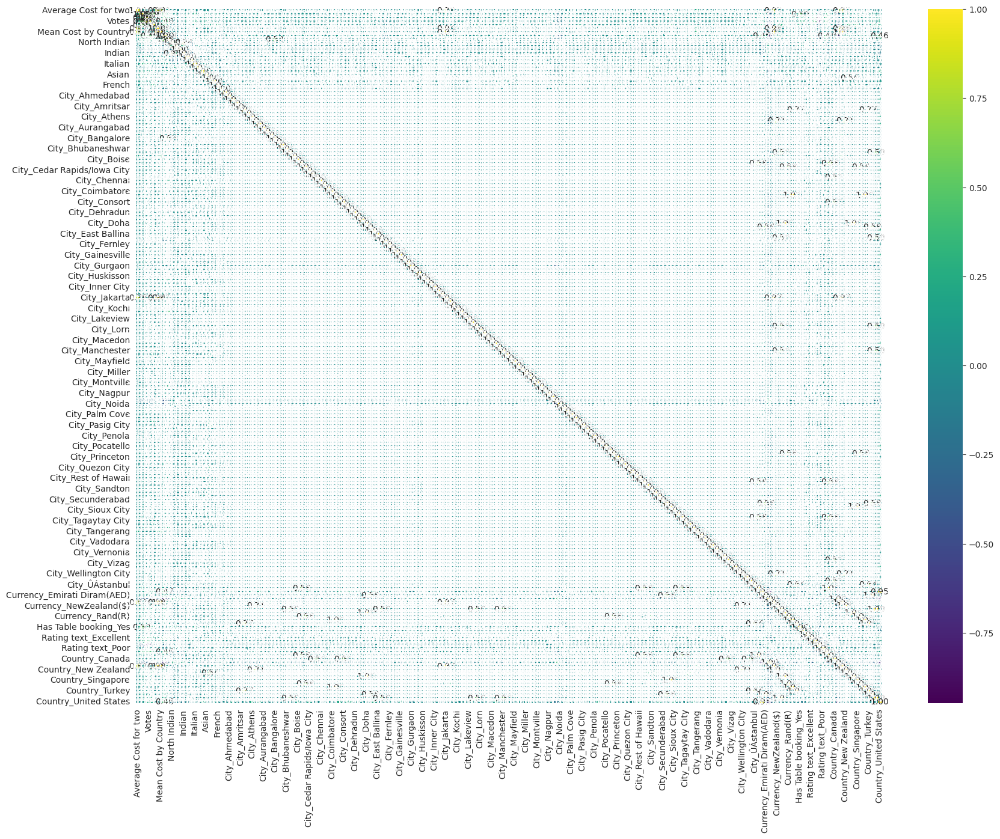

In [117]:
plt.figure(figsize=(20,15))
sns.heatmap(data=df.corr(), annot=True, fmt='0.2f', cmap='viridis')
plt.show()

<h2 style="color:#ffaa00">DATA PREPROCESSING ⤵️</h2>

<p style="font-size:140%;color:#00557f">SPLITTING THE DATASET INTO TRAINING DATA AND TESTING DATA ⬇️ </p>

In [118]:
from sklearn.model_selection import train_test_split

In [119]:
df

,Average Cost for two,Price range,Aggregate rating,Votes,AVERAGE COST FOR TWO IN (USD $),Mean Cost by City,Mean Cost by Country,Mean aggregate rating ny City,Mean Votes by City,North Indian,Chinese,Fast Food,Indian,Cafe,Desserts,Italian,South Indian,American,Asian,Filipino,Japanese,French,Mughlai,City_Agra,City_Ahmedabad,City_Albany,City_Allahabad,City_Amritsar,City_Ankara,City_Armidale,City_Athens,City_Auckland,City_Augusta,City_Aurangabad,City_Balingup,City_Bandung,City_Bangalore,City_Beechworth,City_Bhopal,City_Bhubaneshwar,City_Birmingham,City_Bogor,City_Boise,City_Brasí_lia,City_Cape Town,City_Cedar Rapids/Iowa City,City_Chandigarh,City_Chatham-Kent,City_Chennai,City_Clatskanie,City_Cochrane,City_Coimbatore,City_Colombo,City_Columbus,City_Consort,City_Dalton,City_Davenport,City_Dehradun,City_Des Moines,City_Dicky Beach,City_Doha,City_Dubai,City_Dubuque,City_East Ballina,City_Edinburgh,City_Faridabad,City_Fernley,City_Flaxton,City_Forrest,City_Gainesville,City_Ghaziabad,City_Goa,City_Gurgaon,City_Guwahati,City_Hepburn Springs,City_Huskisson,City_Hyderabad,City_Indore,City_Inner City,City_Inverloch,City_Jaipur,City_Jakarta,City_Johannesburg,City_Kanpur,City_Kochi,City_Kolkata,City_Lakes Entrance,City_Lakeview,City_Lincoln,City_London,City_Lorn,City_Lucknow,City_Ludhiana,City_Macedon,City_Macon,City_Makati City,City_Manchester,City_Mandaluyong City,City_Mangalore,City_Mayfield,City_Mc Millan,City_Middleton Beach,City_Miller,City_Mohali,City_Monroe,City_Montville,City_Mumbai,City_Mysore,City_Nagpur,City_Nashik,City_New Delhi,City_Noida,City_Ojo Caliente,City_Orlando,City_Palm Cove,City_Panchkula,City_Pasay City,City_Pasig City,City_Patna,City_Paynesville,City_Penola,City_Pensacola,City_Phillip Island,City_Pocatello,City_Potrero,City_Pretoria,City_Princeton,City_Puducherry,City_Pune,City_Quezon City,City_Ranchi,City_Randburg,City_Rest of Hawaii,City_Rio de Janeiro,City_San Juan City,City_Sandton,City_Santa Rosa,City_Savannah,City_Secunderabad,City_Sharjah,City_Singapore,City_Sioux City,City_Surat,City_Sí£o Paulo,City_Tagaytay City,City_Taguig City,City_Tampa Bay,City_Tangerang,City_Tanunda,City_Trentham East,City_Vadodara,City_Valdosta,City_Varanasi,City_Vernonia,City_Victor Harbor,City_Vineland Station,City_Vizag,City_Waterloo,City_Weirton,City_Wellington City,City_Winchester Bay,City_Yorkton,City_ÛÁstanbul,Currency_Brazilian Real(R$),Currency_Dollar($),Currency_Emirati Diram(AED),Currency_Indian Rupees(Rs.),Currency_Indonesian Rupiah(IDR),Currency_NewZealand($),Currency_Pounds(£),Currency_Qatari Rial(QR),Currency_Rand(R),Currency_Sri Lankan Rupee(LKR),Currency_Turkish Lira(TL),Has Table booking_Yes,Has Online delivery_Yes,Is delivering now_Yes,Rating text_Excellent,Rating text_Good,Rating text_Not rated,Rating text_Poor,Rating text_Very Good,Country_Brazil,Country_Canada,Country_India,Country_Indonesia,Country_New Zealand,Country_Phillipines,Country_Qatar,Country_Singapore,Country_South Africa,Country_Sri Lanka,Country_Turkey,Country_UAE,Country_United Kingdom,Country_United States
0,1100,3,4.8,1.191885,81.40,1150.000000,1606.818182,4.650000,452.500000,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1,1200,3,4.5,1.507786,88.80,1150.000000,1606.818182,4.650000,452.500000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,4000,4,4.4,1.116765,296.00,2000.000000,1606.818182,4.625000,300.00

In [120]:
X = df.drop(['Average Cost for two','AVERAGE COST FOR TWO IN (USD $)','Price range'], axis=1)
y = df['AVERAGE COST FOR TWO IN (USD $)']

In [121]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

<p style="font-size:140%;color:#338fff">DATA SCALING ↩️</p>

In [122]:
from sklearn.preprocessing import StandardScaler

In [123]:
scaler = StandardScaler()

In [124]:
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_train

,Aggregate rating,Votes,Mean Cost by City,Mean Cost by Country,Mean aggregate rating ny City,Mean Votes by City,North Indian,Chinese,Fast Food,Indian,Cafe,Desserts,Italian,South Indian,American,Asian,Filipino,Japanese,French,Mughlai,City_Agra,City_Ahmedabad,City_Albany,City_Allahabad,City_Amritsar,City_Ankara,City_Armidale,City_Athens,City_Auckland,City_Augusta,City_Aurangabad,City_Balingup,City_Bandung,City_Bangalore,City_Beechworth,City_Bhopal,City_Bhubaneshwar,City_Birmingham,City_Bogor,City_Boise,City_Brasí_lia,City_Cape Town,City_Cedar Rapids/Iowa City,City_Chandigarh,City_Chatham-Kent,City_Chennai,City_Clatskanie,City_Cochrane,City_Coimbatore,City_Colombo,City_Columbus,City_Consort,City_Dalton,City_Davenport,City_Dehradun,City_Des Moines,City_Dicky Beach,City_Doha,City_Dubai,City_Dubuque,City_East Ballina,City_Edinburgh,City_Faridabad,City_Fernley,City_Flaxton,City_Forrest,City_Gainesville,City_Ghaziabad,City_Goa,City_Gurgaon,City_Guwahati,City_Hepburn Springs,City_Huskisson,City_Hyderabad,City_Indore,City_Inner City,City_Inverloch,City_Jaipur,City_Jakarta,City_Johannesburg,City_Kanpur,City_Kochi,City_Kolkata,City_Lakes Entrance,City_Lakeview,City_Lincoln,City_London,City_Lorn,City_Lucknow,City_Ludhiana,City_Macedon,City_Macon,City_Makati City,City_Manchester,City_Mandaluyong City,City_Mangalore,City_Mayfield,City_Mc Millan,City_Middleton Beach,City_Miller,City_Mohali,City_Monroe,City_Montville,City_Mumbai,City_Mysore,City_Nagpur,City_Nashik,City_New Delhi,City_Noida,City_Ojo Caliente,City_Orlando,City_Palm Cove,City_Panchkula,City_Pasay City,City_Pasig City,City_Patna,City_Paynesville,City_Penola,City_Pensacola,City_Phillip Island,City_Pocatello,City_Potrero,City_Pretoria,City_Princeton,City_Puducherry,City_Pune,City_Quezon City,City_Ranchi,City_Randburg,City_Rest of Hawaii,City_Rio de Janeiro,City_San Juan City,City_Sandton,City_Santa Rosa,City_Savannah,City_Secunderabad,City_Sharjah,City_Singapore,City_Sioux City,City_Surat,City_Sí£o Paulo,City_Tagaytay City,City_Taguig City,City_Tampa Bay,City_Tangerang,City_Tanunda,City_Trentham East,City_Vadodara,City_Valdosta,City_Varanasi,City_Vernonia,City_Victor Harbor,City_Vineland Station,City_Vizag,City_Waterloo,City_Weirton,City_Wellington City,City_Winchester Bay,City_Yorkton,City_ÛÁstanbul,Currency_Brazilian Real(R$),Currency_Dollar($),Currency_Emirati Diram(AED),Currency_Indian Rupees(Rs.),Currency_Indonesian Rupiah(IDR),Currency_NewZealand($),Currency_Pounds(£),Currency_Qatari Rial(QR),Currency_Rand(R),Currency_Sri Lankan Rupee(LKR),Currency_Turkish Lira(TL),Has Table booking_Yes,Has Online delivery_Yes,Is delivering now_Yes,Rating text_Excellent,Rating text_Good,Rating text_Not rated,Rating text_Poor,Rating text_Very Good,Country_Brazil,Country_Canada,Country_India,Country_Indonesia,Country_New Zealand,Country_Phillipines,Country_Qatar,Country_Singapore,Country_South Africa,Country_Sri Lanka,Country_Turkey,Country_UAE,Country_United Kingdom,Country_United States
0,0.487662,0.887633,-0.002268,-0.039498,2.229639,5.943150,-0.851924,-0.631876,-0.514278,-0.904056,-0.28582,-0.272472,-0.296402,-0.264911,4.633637,-0.156655,-0.036202,-0.119745,-0.059553,-0.341754,-0.041285,-0.0525,-0.045811,-0.045811,-0.045811,-0.044353,-0.011441,-0.042847,-0.045811,-0.045811,-0.047224,-0.011441,0.0,-0.039663,-0.011441,-0.048596,-0.044353,-0.045811,-0.016182,-0.044353,-0.048596,-0.047224,-0.044353,-0.042847,-0.011441,-0.045811,-0.011441,-0.011441,-0.047224,-0.045811,-0.047224,-0.011441,-0.042847,-0.042847,-0.042847,-0.044353,0.0,-0.049931,-0.044353,-0.048596,-0.011441,-0.044353,-0.165632,-0.011441,-0.011441,-0.011441,-0.042847,-0.0525,-0.049931,-0.360801,-0.044353,-0.016182,-0.011441,-0.045811,-0.047224,-0.016182,-0.011441,-0.048596,-0.037972,-0.028035,-0.045811,-0.042847,-0.047224,-0.011441,-0.011441,-0.011441,-0.045811,-0.011441,-0.044353,-0.047224,-0.011441,-0.045811,-0.016182,-0.048596,-0.022887,-0.047224,0.0,-0.011441,0.0,0.0,-0.011441,-0.011441,-0.011441,24.221732,-0.044353,-0.045811,-0.

In [125]:
X_train.shape

(7640, 193)

In [126]:
y_train

2482    10.20
5987     8.40
6029     2.40
8809     4.20
6549     1.44
        ...  
599     76.95
5695     2.40
8006     4.80
1361     4.20
1547    30.00
Name: AVERAGE COST FOR TWO IN (USD $), Length: 7640, dtype: float64

In [127]:
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
X_test

,Aggregate rating,Votes,Mean Cost by City,Mean Cost by Country,Mean aggregate rating ny City,Mean Votes by City,North Indian,Chinese,Fast Food,Indian,Cafe,Desserts,Italian,South Indian,American,Asian,Filipino,Japanese,French,Mughlai,City_Agra,City_Ahmedabad,City_Albany,City_Allahabad,City_Amritsar,City_Ankara,City_Armidale,City_Athens,City_Auckland,City_Augusta,City_Aurangabad,City_Balingup,City_Bandung,City_Bangalore,City_Beechworth,City_Bhopal,City_Bhubaneshwar,City_Birmingham,City_Bogor,City_Boise,City_Brasí_lia,City_Cape Town,City_Cedar Rapids/Iowa City,City_Chandigarh,City_Chatham-Kent,City_Chennai,City_Clatskanie,City_Cochrane,City_Coimbatore,City_Colombo,City_Columbus,City_Consort,City_Dalton,City_Davenport,City_Dehradun,City_Des Moines,City_Dicky Beach,City_Doha,City_Dubai,City_Dubuque,City_East Ballina,City_Edinburgh,City_Faridabad,City_Fernley,City_Flaxton,City_Forrest,City_Gainesville,City_Ghaziabad,City_Goa,City_Gurgaon,City_Guwahati,City_Hepburn Springs,City_Huskisson,City_Hyderabad,City_Indore,City_Inner City,City_Inverloch,City_Jaipur,City_Jakarta,City_Johannesburg,City_Kanpur,City_Kochi,City_Kolkata,City_Lakes Entrance,City_Lakeview,City_Lincoln,City_London,City_Lorn,City_Lucknow,City_Ludhiana,City_Macedon,City_Macon,City_Makati City,City_Manchester,City_Mandaluyong City,City_Mangalore,City_Mayfield,City_Mc Millan,City_Middleton Beach,City_Miller,City_Mohali,City_Monroe,City_Montville,City_Mumbai,City_Mysore,City_Nagpur,City_Nashik,City_New Delhi,City_Noida,City_Ojo Caliente,City_Orlando,City_Palm Cove,City_Panchkula,City_Pasay City,City_Pasig City,City_Patna,City_Paynesville,City_Penola,City_Pensacola,City_Phillip Island,City_Pocatello,City_Potrero,City_Pretoria,City_Princeton,City_Puducherry,City_Pune,City_Quezon City,City_Ranchi,City_Randburg,City_Rest of Hawaii,City_Rio de Janeiro,City_San Juan City,City_Sandton,City_Santa Rosa,City_Savannah,City_Secunderabad,City_Sharjah,City_Singapore,City_Sioux City,City_Surat,City_Sí£o Paulo,City_Tagaytay City,City_Taguig City,City_Tampa Bay,City_Tangerang,City_Tanunda,City_Trentham East,City_Vadodara,City_Valdosta,City_Varanasi,City_Vernonia,City_Victor Harbor,City_Vineland Station,City_Vizag,City_Waterloo,City_Weirton,City_Wellington City,City_Winchester Bay,City_Yorkton,City_ÛÁstanbul,Currency_Brazilian Real(R$),Currency_Dollar($),Currency_Emirati Diram(AED),Currency_Indian Rupees(Rs.),Currency_Indonesian Rupiah(IDR),Currency_NewZealand($),Currency_Pounds(£),Currency_Qatari Rial(QR),Currency_Rand(R),Currency_Sri Lankan Rupee(LKR),Currency_Turkish Lira(TL),Has Table booking_Yes,Has Online delivery_Yes,Is delivering now_Yes,Rating text_Excellent,Rating text_Good,Rating text_Not rated,Rating text_Poor,Rating text_Very Good,Country_Brazil,Country_Canada,Country_India,Country_Indonesia,Country_New Zealand,Country_Phillipines,Country_Qatar,Country_Singapore,Country_South Africa,Country_Sri Lanka,Country_Turkey,Country_UAE,Country_United Kingdom,Country_United States
0,0.421799,-0.079611,-0.041034,-0.039498,-0.354030,-0.184026,-0.851924,-0.631876,1.944473,-0.904056,-0.28582,-0.272472,-0.296402,-0.264911,-0.215813,-0.156655,-0.036202,-0.119745,-0.059553,-0.341754,-0.041285,-0.0525,-0.045811,-0.045811,-0.045811,-0.044353,-0.011441,-0.042847,-0.045811,-0.045811,-0.047224,-0.011441,0.0,-0.039663,-0.011441,-0.048596,-0.044353,-0.045811,-0.016182,-0.044353,-0.048596,-0.047224,-0.044353,-0.042847,-0.011441,-0.045811,-0.011441,-0.011441,-0.047224,-0.045811,-0.047224,-0.011441,-0.042847,-0.042847,-0.042847,-0.044353,0.0,-0.049931,-0.044353,-0.048596,-0.011441,-0.044353,-0.165632,-0.011441,-0.011441,-0.011441,-0.042847,-0.0525,-0.049931,-0.360801,-0.044353,-0.016182,-0.011441,-0.045811,-0.047224,-0.016182,-0.011441,-0.048596,-0.037972,-0.028035,-0.045811,-0.042847,-0.047224,-0.011441,-0.011441,-0.011441,-0.045811,-0.011441,-0.044353,-0.047224,-0.011441,-0.045811,-0.016182,-0.048596,-0.022887,-0.047224,0.0,-0.011441,0.0,0.0,-0.011441,-0.011441,-0.011441,-0.041285,-0.044353,-0.045811,

In [128]:
X_test.shape

(1911, 193)

In [129]:
y_test

4594     4.8
3376     3.6
2266     6.6
1638     7.2
3695    12.0
        ... 
5452     6.0
4437     4.8
6023    10.8
4428     1.8
2372     4.2
Name: AVERAGE COST FOR TWO IN (USD $), Length: 1911, dtype: float64

<h2 style="color:#00557f">MACHINE LEARNING MODELS ⬇️</h2>

<p style="font-size:140%;color:#0c1fcc">First, we will build the regression model to predict the average cost of two people in dollar currency.</p>

<p style="font-size:140%;color:cyan">LINEAR REGRESSION</p>

In [130]:
from sklearn.linear_model import LinearRegression

In [131]:
lr = LinearRegression()

In [132]:
lr.fit(X_train, y_train)

LinearRegression()

In [133]:
lr_pred = lr.predict(X_test)
lr_pred

array([ 3.78051508,  3.88989008,  6.45239008, ..., 15.30395258,
        5.20239008,  6.12426508])

In [134]:
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error, root_mean_squared_error

In [135]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, lr_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, lr_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {root_mean_squared_error(y_test, lr_pred)}')
print()
print(f'The R2 SCORE is {r2_score(y_test, lr_pred)}')
print()
print('Training r2 score is',lr.score(X_train, y_train))
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, lr_pred)}')

The mean absolute error (MAE) is 8546385767876.463

The mean sqaured error (MSE) is 2.543108401996308e+28

The root mean sqaured error (RMSE) is 159471263931666.0

The R2 SCORE is -7.921966688415121e+25

Training r2 score is 0.61328432091389

The mean absolute percentage error is 1.7841833438763043e+27


<Axes: xlabel='AVERAGE COST FOR TWO IN (USD $)'>

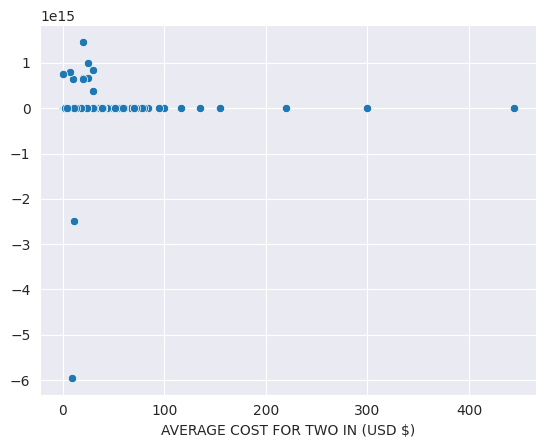

In [136]:
sns.scatterplot(x=y_test, y=lr_pred)

In [137]:
print('COEFFICIENTS : ',lr.coef_)
print()
print('INTERCEPT : ', lr.fit_intercept)

COEFFICIENTS :  [ 1.84587709e+00  1.67283669e+00  2.90757329e+14 -1.27671152e+14
 -3.55881345e+14  2.52433768e+14  7.51358170e-01 -7.79614957e-03
 -5.23662544e-01 -8.95507812e-01 -7.34375000e-01 -5.78125000e-01
  6.25000000e-01 -5.85937500e-02  6.71875000e-01  2.42187500e-01
  1.06835938e+00  5.07812500e-01  3.58593750e+00 -1.93359375e-01
  1.49866050e+13 -3.37678581e+12 -4.00756780e+13  4.38923188e+12
  6.43694795e+12 -1.17244815e+13 -8.44607207e+12 -4.88175909e+13
 -3.64688430e+14 -4.14852919e+13  4.13592602e+12 -1.03113910e+13
 -1.82437459e+14 -9.75159441e+13 -4.15515360e+12  1.55027603e+13
  1.19503929e+13  8.69866388e+13  6.90115339e+13 -4.31333654e+13
  2.13325621e+14  1.13704749e+14 -3.61480260e+13 -5.19135498e+12
  3.50656927e+14 -4.06072758e+13 -5.42319718e+12 -1.19328138e+13
  1.61854206e+13 -4.92427697e+13 -3.86830105e+13  3.48379546e+14
 -2.63668387e+13 -3.69251076e+13  1.70349417e+13 -4.55288690e+13
  1.20413216e+14 -3.43799409e+14 -2.99040643e+13 -4.39914361e+13
 -5.01248

<p style="font-size:140%;color:#ffb158">Our linear regression model is giving r2 score in negative which means that this model is horrible. We will improve our performance by training some more models.</p>

In [138]:
y_test

4594     4.8
3376     3.6
2266     6.6
1638     7.2
3695    12.0
        ... 
5452     6.0
4437     4.8
6023    10.8
4428     1.8
2372     4.2
Name: AVERAGE COST FOR TWO IN (USD $), Length: 1911, dtype: float64

<h2>DECISION TREE REGRESSOR ↩️</h2>

In [139]:
from sklearn.tree import DecisionTreeRegressor

In [140]:
dtr = DecisionTreeRegressor()

In [141]:
dtr.fit(X_train, y_train)

DecisionTreeRegressor()

In [142]:
dtr_pred = dtr.predict(X_test)
dtr_pred

array([ 5.4,  5.2,  6. , ..., 10.2,  1.8,  8.4])

In [143]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, dtr_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, dtr_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {np.sqrt(mean_squared_error(y_test, dtr_pred))}')
print()
print(f'The R2 SCORE is {r2_score(y_test, dtr_pred)}')
print()
print('Training r2 score is',dtr.score(X_train, y_train))
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, lr_pred)}')

The mean absolute error (MAE) is 4.5431621509973565

The mean sqaured error (MSE) is 133.1050298315548

The root mean sqaured error (RMSE) is 11.53711531673125

The R2 SCORE is 0.585368200758432

Training r2 score is 0.9952833967952133

The mean absolute percentage error is 1.7841833438763043e+27


<Axes: xlabel='AVERAGE COST FOR TWO IN (USD $)'>

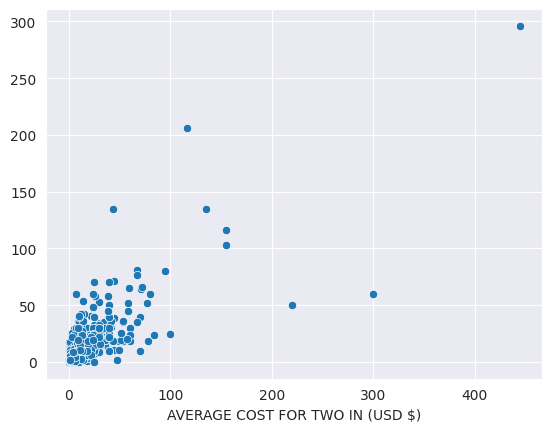

In [144]:
sns.scatterplot(x=y_test, y=dtr_pred)

<p style="font-size:140%;color:#ff3939">Our Decision Tree model is giving r2 score of 0.55  which is a really good score. Let's see if we can improve it by training some more models</p>

<h2>K NEAREST NEIGHBOURS REGRESSOR MODEL ⤵️</h2>

In [145]:
from sklearn.neighbors import KNeighborsRegressor

In [146]:
knn = KNeighborsRegressor()

In [147]:
knn.fit(X_train, y_train)

KNeighborsRegressor()

In [148]:
knn_pred = knn.predict(X_test)
knn_pred

array([ 4.92,  4.44,  7.2 , ..., 15.36,  1.44,  8.16])

In [149]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, knn_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, knn_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {root_mean_squared_error(y_test, knn_pred)}')
print()
print(f'The R2 SCORE is {r2_score(y_test, knn_pred)}')
print()
print(f'Training r2 score is {knn.score(X_train, y_train)}')
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, knn_pred)}')

The mean absolute error (MAE) is 4.2103950811093664

The mean sqaured error (MSE) is 166.42436012611196

The root mean sqaured error (RMSE) is 12.900556582028234

The R2 SCORE is 0.4815760759451202

Training r2 score is 0.6851558802015393

The mean absolute percentage error is 89176457299686.3


<Axes: xlabel='AVERAGE COST FOR TWO IN (USD $)'>

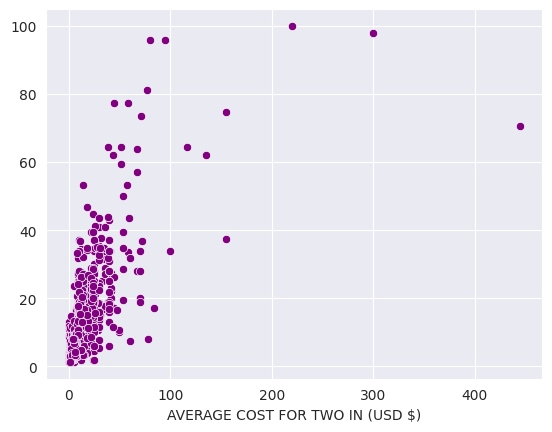

In [150]:
sns.scatterplot(x=y_test, y=knn_pred, color='purple')

<h2>RANDOM FOREST REGRESSOR ⤵️</h2>

In [151]:
from sklearn.ensemble import RandomForestRegressor

In [152]:
rfr = RandomForestRegressor()

In [153]:
rfr.fit(X_train, y_train)

RandomForestRegressor()

In [154]:
rfr_pred = rfr.predict(X_test)
rfr_pred

array([ 4.9172    ,  4.98965714,  6.732     , ..., 12.624     ,
        1.6307    ,  8.274     ])

In [155]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, rfr_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, rfr_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {root_mean_squared_error(y_test, rfr_pred)}')
print()
print(f'The R2 SCORE is {r2_score(y_test, rfr_pred)}')
print()
print(f'Training r2 score is {rfr.score(X_train, y_train)}')
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, rfr_pred)}')

The mean absolute error (MAE) is 3.957800983430643

The mean sqaured error (MSE) is 109.89378581729993

The root mean sqaured error (RMSE) is 10.483023696305372

The R2 SCORE is 0.6576729053999091

Training r2 score is 0.9370620000082771

The mean absolute percentage error is 84618654223111.44


<Axes: xlabel='AVERAGE COST FOR TWO IN (USD $)'>

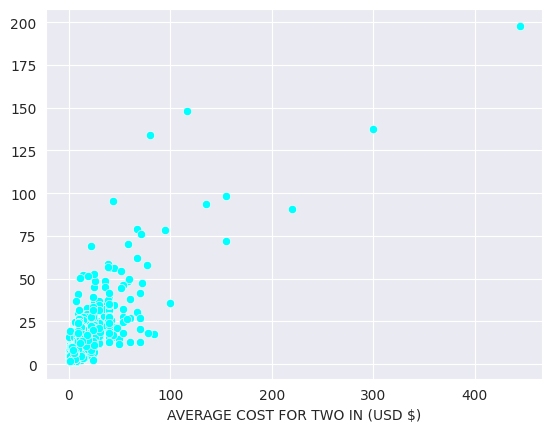

In [156]:
sns.scatterplot(x=y_test, y=rfr_pred, color='cyan')

<h2>EXTRA TREES REGRESSOR MODEL ⬇️</h2>

In [157]:
from sklearn.tree import ExtraTreeRegressor

In [158]:
etr = ExtraTreeRegressor()

In [159]:
etr.fit(X_train, y_train)

ExtraTreeRegressor()

In [160]:
etr_pred = etr.predict(X_test)
etr_pred

array([ 6. ,  5.2,  9.6, ..., 13.2,  1.5,  0. ])

In [161]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, etr_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, etr_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {root_mean_squared_error(y_test, etr_pred)}')
print()
print(f'The R2 SCORE is {r2_score(y_test, etr_pred)}')
print()
print(f'Training r2 score is {etr.score(X_train, y_train)}')
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, etr_pred)}')

The mean absolute error (MAE) is 4.745771570149631

The mean sqaured error (MSE) is 146.00783989771912

The root mean sqaured error (RMSE) is 12.083370386515474

The R2 SCORE is 0.5451750137708608

Training r2 score is 0.9952833967952133

The mean absolute percentage error is 47133434090743.58


<Axes: xlabel='AVERAGE COST FOR TWO IN (USD $)'>

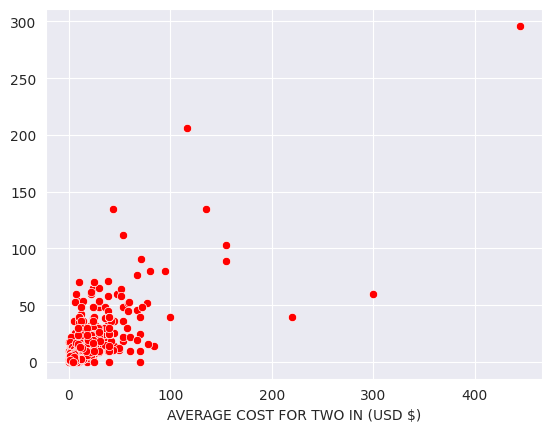

In [162]:
sns.scatterplot(x=y_test, y=etr_pred, color='red')

<h2>XGBOOST REGRESSION MODEL⤵️</h2>

In [163]:
from xgboost import XGBRegressor

In [164]:
xgb = XGBRegressor()

In [165]:
xgb.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [166]:
xgb_pred = xgb.predict(X_test)
xgb_pred

array([ 4.517792 ,  3.58432  ,  7.381685 , ..., 14.081249 ,  3.7172236,
        6.713605 ], dtype=float32)

In [167]:
y_test

4594     4.8
3376     3.6
2266     6.6
1638     7.2
3695    12.0
        ... 
5452     6.0
4437     4.8
6023    10.8
4428     1.8
2372     4.2
Name: AVERAGE COST FOR TWO IN (USD $), Length: 1911, dtype: float64

In [168]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, xgb_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, xgb_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {root_mean_squared_error(y_test, xgb_pred)}')
print()
print(f'The R2 SCORE is {r2_score(y_test, xgb_pred)}')
print()
print(f'Training r2 score is {xgb.score(X_train, y_train)}')
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, xgb_pred)}')

The mean absolute error (MAE) is 3.9294083164120015

The mean sqaured error (MSE) is 115.5851805727226

The root mean sqaured error (RMSE) is 10.751054858604462

The R2 SCORE is 0.6399437989144419

Training r2 score is 0.9394647753977496

The mean absolute percentage error is 105323386084849.2


<Axes: xlabel='AVERAGE COST FOR TWO IN (USD $)'>

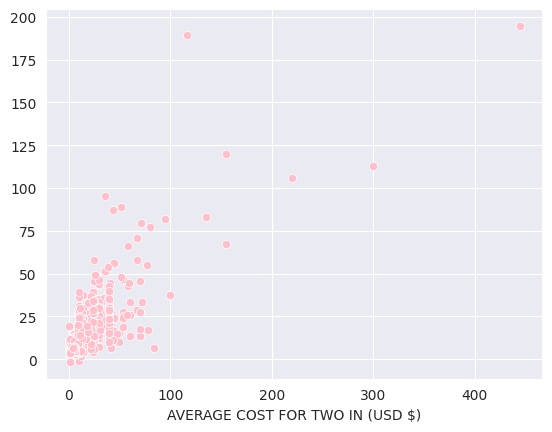

In [169]:
sns.scatterplot(x=y_test, y=xgb_pred, color='pink')

<h2>SVM MODEL ⤵️</h2>

In [170]:
from sklearn.svm import SVR

In [171]:
svr = SVR()

In [172]:
svr.fit(X_train, y_train)

SVR()

In [173]:
svr_pred = svr.predict(X_test)
svr_pred

array([ 4.12938995,  3.08965279,  6.47734926, ..., 12.77191051,
        3.20235134, 13.45594601])

In [174]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, svr_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, svr_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {root_mean_squared_error(y_test, svr_pred)}')
print()
print(f'The R2 SCORE is {r2_score(y_test, svr_pred)}')
print()
print(f'Training r2 score is {svr.score(X_train, y_train)}')
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, svr_pred)}')

The mean absolute error (MAE) is 4.448308143869711

The mean sqaured error (MSE) is 244.29608528168714

The root mean sqaured error (RMSE) is 15.629973937332306

The R2 SCORE is 0.23900001738323273

Training r2 score is 0.28103921555432265

The mean absolute percentage error is 144352877598109.5


<Axes: xlabel='AVERAGE COST FOR TWO IN (USD $)'>

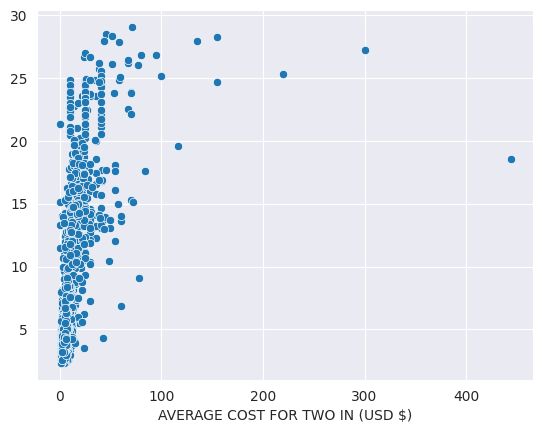

In [175]:
sns.scatterplot(x=y_test, y=svr_pred)

<h2>CATBOOST MODEL ⤵️</h2>

In [176]:
from catboost import CatBoostRegressor

In [177]:
cat = CatBoostRegressor(verbose=False)

In [178]:
cat.fit(X_train, y_train)

In [179]:
cat_pred = cat.predict(X_test)
cat_pred

array([ 3.9150138 ,  3.56758039,  6.78776826, ..., 14.00477012,
        3.84768949,  6.0102622 ])

In [180]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, cat_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, cat_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {root_mean_squared_error(y_test, cat_pred)}')
print()
print(f'The R2 SCORE is {r2_score(y_test, cat_pred)}')
print()
print(f'Training r2 score is {cat.score(X_train, y_train)}')
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, cat_pred)}')

The mean absolute error (MAE) is 3.906948166717047

The mean sqaured error (MSE) is 128.05384701065793

The root mean sqaured error (RMSE) is 11.316087972910864

The R2 SCORE is 0.601103000742903

Training r2 score is 0.9122067460271873

The mean absolute percentage error is 105130078072262.8


<h2>GRADIENT BOOSTING MODEL ⤵️ </h2>

In [181]:
from sklearn.ensemble import GradientBoostingRegressor

In [182]:
gbr = GradientBoostingRegressor()

In [183]:
gbr.fit(X_train, y_train)

GradientBoostingRegressor()

In [184]:
gbr_pred = gbr.predict(X_test)
gbr_pred

array([ 4.5357439 ,  4.13724765,  6.7975953 , ..., 15.17353259,
        4.49859015,  6.87137799])

In [185]:
print(f'The mean absolute error (MAE) is {mean_absolute_error(y_test, gbr_pred)}')
print()
print(f'The mean sqaured error (MSE) is {mean_squared_error(y_test, gbr_pred)}')
print()
print(f'The root mean sqaured error (RMSE) is {root_mean_squared_error(y_test, gbr_pred)}')
print()
print(f'The R2 SCORE is {r2_score(y_test, gbr_pred)}')
print()
print(f'Training r2 score is {gbr.score(X_train, y_train)}')
print()
print(f'The mean absolute percentage error is {mean_absolute_percentage_error(y_test, gbr_pred)}')

The mean absolute error (MAE) is 4.1094857278100045

The mean sqaured error (MSE) is 120.65173220687937

The root mean sqaured error (RMSE) is 10.984158238430442

The R2 SCORE is 0.6241611239645978

Training r2 score is 0.809648789911961

The mean absolute percentage error is 144545056696951.72


<p style="font-size:140%;color:#f263ff">We tested multiple machine learning models to find out which is the best performing model and the results were quite shocking Random Forest Regressor is best model with an r2 score of 0.65 even better than Extra Trees Regressor and CatBoost. The runnerup is none other than Extra Trees Regressor which came close and it gave an R2 score of 0.63 which is really good considering the situtaion. So, we will use Random Forest machine learning model for further training.</p>

In [186]:
model_names = ['Extra Trees', 'Decision Tree', 'Random Forest', 'SVM', 'KNN', 'Gradient Boosting', 'XGBOOST', 'CATBOOST']
models = [etr_pred, dtr_pred, rfr_pred, svr_pred, knn_pred, gbr_pred, xgb_pred, cat_pred]
r2scorelist = []
for x in models:
    print(r2_score(y_test, x))
    r2scorelist.append(r2_score(y_test, x))
print(r2scorelist)

0.5451750137708608
0.585368200758432
0.6576729053999091
0.23900001738323273
0.4815760759451202
0.6241611239645978
0.6399437989144419
0.601103000742903
[0.5451750137708608, 0.585368200758432, 0.6576729053999091, 0.23900001738323273, 0.4815760759451202, 0.6241611239645978, 0.6399437989144419, 0.601103000742903]


In [187]:
r2_data = pd.DataFrame({
    'Model': model_names,
    'R2 Score': r2scorelist
})

In [188]:
r2_data = r2_data.sort_values(by='R2 Score', ascending=False)

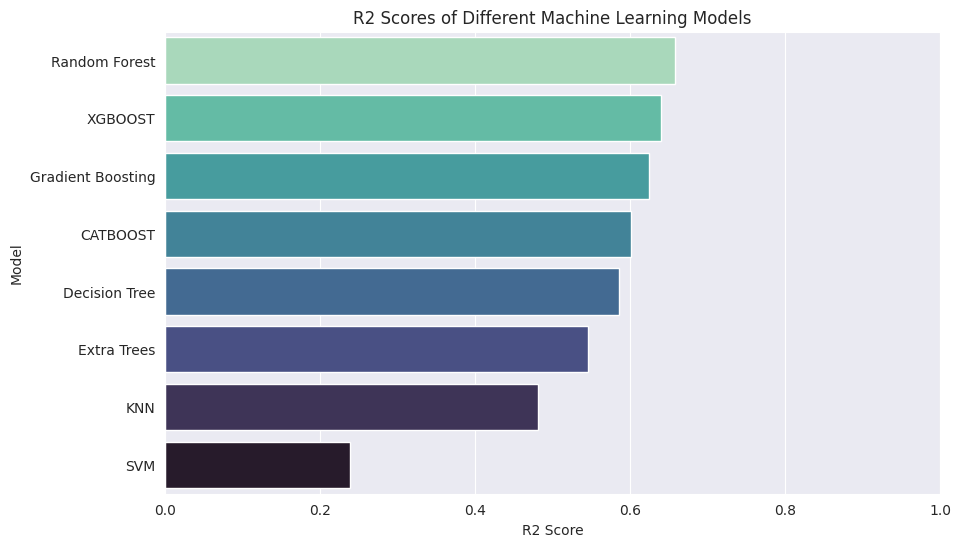

In [189]:
plt.figure(figsize=(10, 6))
sns.barplot(data=r2_data, y='Model', x='R2 Score', palette='mako_r')
plt.title('R2 Scores of Different Machine Learning Models')
plt.ylabel('Model')
plt.xlabel('R2 Score')
plt.xlim(0, 1) 
plt.show()

<h2 style="color:#ff2fff">CROSS VALIDATION ⤵️</h2>

In [190]:
from sklearn.model_selection import cross_val_score

np.random.seed(10)
def r2(model, X_train,y_train):
    r2 = cross_val_score(model, X ,y , scoring='r2', cv=5)
    return(r2)


models = [LinearRegression(),
          DecisionTreeRegressor(),
          ExtraTreeRegressor(),
          RandomForestRegressor(),
          SVR(),
          KNeighborsRegressor(),
          GradientBoostingRegressor(),
          XGBRegressor(),
          CatBoostRegressor(verbose=False)]
            


names = ['LR', 'DTR', 'ETR', 'RFR', 'SVR', 'KNN', 'GBR', 'XGB', 'CAT']

for model,name in zip(models,names):
    score = r2(model,X_train,y_train)
    print(name, score)
    print("{}    : {:.6f}, {:4f}".format(name,score.mean(),score.std()))
    print('**************************************************************')

LR [ 2.73347977e-01 -2.15648737e+14  3.39379591e-01  4.29665706e-01
 -8.20845810e+03]
LR    : -43129747320058.976562, 86259494636014.250000
**************************************************************
DTR [-0.43090426 -0.42740831  0.30048784  0.28335765 -0.83757745]
DTR    : -0.222409, 0.445679
**************************************************************
ETR [ 0.16455081 -0.22679364  0.17751074  0.31925472 -0.38735906]
ETR    : 0.009433, 0.268904
**************************************************************
RFR [-0.01957598  0.28375131  0.50987687  0.52079692 -0.84998894]
RFR    : 0.088972, 0.508921
**************************************************************
SVR [-0.15748343 -0.11817785 -0.00549013 -0.02431076  0.23551581]
SVR    : -0.013989, 0.137024
**************************************************************
KNN [-0.3226507   0.34300859  0.50451832  0.47048402 -1.25348833]
KNN    : -0.051626, 0.671649
**************************************************************
GBR [ 0.0

<p style="font-size:140%;color:brown">We are not getting improved results with cross validation, So, we will now try Hyperparamteter tuninng.</p>

<h2 style="color:#2ed9ff">HYPERPARAMETER TUNING ⤵️</h2>

In [191]:
from sklearn.model_selection import RandomizedSearchCV

In [192]:
param_grid = {
    'n_estimators': [100, 150, 200, 300, 400, 500],
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth': [5, 10, 20, 30, 40, 50],
    'min_samples_split': [2,3, 5, 7, 9, 11],
    'min_samples_leaf': [1, 2, 4],
    'bootstrap': [True, False]
}

In [193]:
random = RandomizedSearchCV(RandomForestRegressor(),param_distributions=param_grid,scoring='r2',n_jobs=-1,cv=5, verbose=4)

In [195]:
num = 1
for x in range(0,5):
    random.fit(X_train, y_train)
    print(f'The {num} iteration score is {random.best_score_}')
    num+=1

Fitting 5 folds for each of 10 candidates, totalling 50 fits
The 1 iteration score is 0.5725087686986771
Fitting 5 folds for each of 10 candidates, totalling 50 fits
The 2 iteration score is 0.5736256746596323
Fitting 5 folds for each of 10 candidates, totalling 50 fits
The 3 iteration score is 0.5628785146009713
Fitting 5 folds for each of 10 candidates, totalling 50 fits
The 4 iteration score is 0.573136816104848
Fitting 5 folds for each of 10 candidates, totalling 50 fits
The 5 iteration score is 0.5746847444391207


<p style="font-size:140%;color:#b5761e">Even after hyperparameter tuning and cross validation,we cannot improve the r2 score by much, so we will stop here and the final score is 0.65. So, we will now save the model using joblib.</p>

<h2 style="color:#22b42e">SAVING THE MODEL ⬇️</h2>

In [196]:
import joblib

In [197]:
joblib.dump(rfr, 'Average_Cost_for_two_Regression_Prediction.pkl')

['Average_Cost_for_two_Regression_Prediction.pkl']

In [198]:
#******************************************************************************************

<h2 style="color:red">Now, we will build our second model to predict the price range ⬇️</h2>

In [199]:
df

,Average Cost for two,Price range,Aggregate rating,Votes,AVERAGE COST FOR TWO IN (USD $),Mean Cost by City,Mean Cost by Country,Mean aggregate rating ny City,Mean Votes by City,North Indian,Chinese,Fast Food,Indian,Cafe,Desserts,Italian,South Indian,American,Asian,Filipino,Japanese,French,Mughlai,City_Agra,City_Ahmedabad,City_Albany,City_Allahabad,City_Amritsar,City_Ankara,City_Armidale,City_Athens,City_Auckland,City_Augusta,City_Aurangabad,City_Balingup,City_Bandung,City_Bangalore,City_Beechworth,City_Bhopal,City_Bhubaneshwar,City_Birmingham,City_Bogor,City_Boise,City_Brasí_lia,City_Cape Town,City_Cedar Rapids/Iowa City,City_Chandigarh,City_Chatham-Kent,City_Chennai,City_Clatskanie,City_Cochrane,City_Coimbatore,City_Colombo,City_Columbus,City_Consort,City_Dalton,City_Davenport,City_Dehradun,City_Des Moines,City_Dicky Beach,City_Doha,City_Dubai,City_Dubuque,City_East Ballina,City_Edinburgh,City_Faridabad,City_Fernley,City_Flaxton,City_Forrest,City_Gainesville,City_Ghaziabad,City_Goa,City_Gurgaon,City_Guwahati,City_Hepburn Springs,City_Huskisson,City_Hyderabad,City_Indore,City_Inner City,City_Inverloch,City_Jaipur,City_Jakarta,City_Johannesburg,City_Kanpur,City_Kochi,City_Kolkata,City_Lakes Entrance,City_Lakeview,City_Lincoln,City_London,City_Lorn,City_Lucknow,City_Ludhiana,City_Macedon,City_Macon,City_Makati City,City_Manchester,City_Mandaluyong City,City_Mangalore,City_Mayfield,City_Mc Millan,City_Middleton Beach,City_Miller,City_Mohali,City_Monroe,City_Montville,City_Mumbai,City_Mysore,City_Nagpur,City_Nashik,City_New Delhi,City_Noida,City_Ojo Caliente,City_Orlando,City_Palm Cove,City_Panchkula,City_Pasay City,City_Pasig City,City_Patna,City_Paynesville,City_Penola,City_Pensacola,City_Phillip Island,City_Pocatello,City_Potrero,City_Pretoria,City_Princeton,City_Puducherry,City_Pune,City_Quezon City,City_Ranchi,City_Randburg,City_Rest of Hawaii,City_Rio de Janeiro,City_San Juan City,City_Sandton,City_Santa Rosa,City_Savannah,City_Secunderabad,City_Sharjah,City_Singapore,City_Sioux City,City_Surat,City_Sí£o Paulo,City_Tagaytay City,City_Taguig City,City_Tampa Bay,City_Tangerang,City_Tanunda,City_Trentham East,City_Vadodara,City_Valdosta,City_Varanasi,City_Vernonia,City_Victor Harbor,City_Vineland Station,City_Vizag,City_Waterloo,City_Weirton,City_Wellington City,City_Winchester Bay,City_Yorkton,City_ÛÁstanbul,Currency_Brazilian Real(R$),Currency_Dollar($),Currency_Emirati Diram(AED),Currency_Indian Rupees(Rs.),Currency_Indonesian Rupiah(IDR),Currency_NewZealand($),Currency_Pounds(£),Currency_Qatari Rial(QR),Currency_Rand(R),Currency_Sri Lankan Rupee(LKR),Currency_Turkish Lira(TL),Has Table booking_Yes,Has Online delivery_Yes,Is delivering now_Yes,Rating text_Excellent,Rating text_Good,Rating text_Not rated,Rating text_Poor,Rating text_Very Good,Country_Brazil,Country_Canada,Country_India,Country_Indonesia,Country_New Zealand,Country_Phillipines,Country_Qatar,Country_Singapore,Country_South Africa,Country_Sri Lanka,Country_Turkey,Country_UAE,Country_United Kingdom,Country_United States
0,1100,3,4.8,1.191885,81.40,1150.000000,1606.818182,4.650000,452.500000,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
1,1200,3,4.5,1.507786,88.80,1150.000000,1606.818182,4.650000,452.500000,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
2,4000,4,4.4,1.116765,296.00,2000.000000,1606.818182,4.625000,300.00

In [200]:
X = df.drop(['Average Cost for two', 'Price range', 'AVERAGE COST FOR TWO IN (USD $)'], axis=1)
y = df['Price range']

In [201]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=101)

In [202]:
scaler = StandardScaler()

In [203]:
X_train = pd.DataFrame(scaler.fit_transform(X_train), columns=X_train.columns)
X_train

,Aggregate rating,Votes,Mean Cost by City,Mean Cost by Country,Mean aggregate rating ny City,Mean Votes by City,North Indian,Chinese,Fast Food,Indian,Cafe,Desserts,Italian,South Indian,American,Asian,Filipino,Japanese,French,Mughlai,City_Agra,City_Ahmedabad,City_Albany,City_Allahabad,City_Amritsar,City_Ankara,City_Armidale,City_Athens,City_Auckland,City_Augusta,City_Aurangabad,City_Balingup,City_Bandung,City_Bangalore,City_Beechworth,City_Bhopal,City_Bhubaneshwar,City_Birmingham,City_Bogor,City_Boise,City_Brasí_lia,City_Cape Town,City_Cedar Rapids/Iowa City,City_Chandigarh,City_Chatham-Kent,City_Chennai,City_Clatskanie,City_Cochrane,City_Coimbatore,City_Colombo,City_Columbus,City_Consort,City_Dalton,City_Davenport,City_Dehradun,City_Des Moines,City_Dicky Beach,City_Doha,City_Dubai,City_Dubuque,City_East Ballina,City_Edinburgh,City_Faridabad,City_Fernley,City_Flaxton,City_Forrest,City_Gainesville,City_Ghaziabad,City_Goa,City_Gurgaon,City_Guwahati,City_Hepburn Springs,City_Huskisson,City_Hyderabad,City_Indore,City_Inner City,City_Inverloch,City_Jaipur,City_Jakarta,City_Johannesburg,City_Kanpur,City_Kochi,City_Kolkata,City_Lakes Entrance,City_Lakeview,City_Lincoln,City_London,City_Lorn,City_Lucknow,City_Ludhiana,City_Macedon,City_Macon,City_Makati City,City_Manchester,City_Mandaluyong City,City_Mangalore,City_Mayfield,City_Mc Millan,City_Middleton Beach,City_Miller,City_Mohali,City_Monroe,City_Montville,City_Mumbai,City_Mysore,City_Nagpur,City_Nashik,City_New Delhi,City_Noida,City_Ojo Caliente,City_Orlando,City_Palm Cove,City_Panchkula,City_Pasay City,City_Pasig City,City_Patna,City_Paynesville,City_Penola,City_Pensacola,City_Phillip Island,City_Pocatello,City_Potrero,City_Pretoria,City_Princeton,City_Puducherry,City_Pune,City_Quezon City,City_Ranchi,City_Randburg,City_Rest of Hawaii,City_Rio de Janeiro,City_San Juan City,City_Sandton,City_Santa Rosa,City_Savannah,City_Secunderabad,City_Sharjah,City_Singapore,City_Sioux City,City_Surat,City_Sí£o Paulo,City_Tagaytay City,City_Taguig City,City_Tampa Bay,City_Tangerang,City_Tanunda,City_Trentham East,City_Vadodara,City_Valdosta,City_Varanasi,City_Vernonia,City_Victor Harbor,City_Vineland Station,City_Vizag,City_Waterloo,City_Weirton,City_Wellington City,City_Winchester Bay,City_Yorkton,City_ÛÁstanbul,Currency_Brazilian Real(R$),Currency_Dollar($),Currency_Emirati Diram(AED),Currency_Indian Rupees(Rs.),Currency_Indonesian Rupiah(IDR),Currency_NewZealand($),Currency_Pounds(£),Currency_Qatari Rial(QR),Currency_Rand(R),Currency_Sri Lankan Rupee(LKR),Currency_Turkish Lira(TL),Has Table booking_Yes,Has Online delivery_Yes,Is delivering now_Yes,Rating text_Excellent,Rating text_Good,Rating text_Not rated,Rating text_Poor,Rating text_Very Good,Country_Brazil,Country_Canada,Country_India,Country_Indonesia,Country_New Zealand,Country_Phillipines,Country_Qatar,Country_Singapore,Country_South Africa,Country_Sri Lanka,Country_Turkey,Country_UAE,Country_United Kingdom,Country_United States
0,0.487662,0.887633,-0.002268,-0.039498,2.229639,5.943150,-0.851924,-0.631876,-0.514278,-0.904056,-0.28582,-0.272472,-0.296402,-0.264911,4.633637,-0.156655,-0.036202,-0.119745,-0.059553,-0.341754,-0.041285,-0.0525,-0.045811,-0.045811,-0.045811,-0.044353,-0.011441,-0.042847,-0.045811,-0.045811,-0.047224,-0.011441,0.0,-0.039663,-0.011441,-0.048596,-0.044353,-0.045811,-0.016182,-0.044353,-0.048596,-0.047224,-0.044353,-0.042847,-0.011441,-0.045811,-0.011441,-0.011441,-0.047224,-0.045811,-0.047224,-0.011441,-0.042847,-0.042847,-0.042847,-0.044353,0.0,-0.049931,-0.044353,-0.048596,-0.011441,-0.044353,-0.165632,-0.011441,-0.011441,-0.011441,-0.042847,-0.0525,-0.049931,-0.360801,-0.044353,-0.016182,-0.011441,-0.045811,-0.047224,-0.016182,-0.011441,-0.048596,-0.037972,-0.028035,-0.045811,-0.042847,-0.047224,-0.011441,-0.011441,-0.011441,-0.045811,-0.011441,-0.044353,-0.047224,-0.011441,-0.045811,-0.016182,-0.048596,-0.022887,-0.047224,0.0,-0.011441,0.0,0.0,-0.011441,-0.011441,-0.011441,24.221732,-0.044353,-0.045811,-0.

In [204]:
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)
X_test

,Aggregate rating,Votes,Mean Cost by City,Mean Cost by Country,Mean aggregate rating ny City,Mean Votes by City,North Indian,Chinese,Fast Food,Indian,Cafe,Desserts,Italian,South Indian,American,Asian,Filipino,Japanese,French,Mughlai,City_Agra,City_Ahmedabad,City_Albany,City_Allahabad,City_Amritsar,City_Ankara,City_Armidale,City_Athens,City_Auckland,City_Augusta,City_Aurangabad,City_Balingup,City_Bandung,City_Bangalore,City_Beechworth,City_Bhopal,City_Bhubaneshwar,City_Birmingham,City_Bogor,City_Boise,City_Brasí_lia,City_Cape Town,City_Cedar Rapids/Iowa City,City_Chandigarh,City_Chatham-Kent,City_Chennai,City_Clatskanie,City_Cochrane,City_Coimbatore,City_Colombo,City_Columbus,City_Consort,City_Dalton,City_Davenport,City_Dehradun,City_Des Moines,City_Dicky Beach,City_Doha,City_Dubai,City_Dubuque,City_East Ballina,City_Edinburgh,City_Faridabad,City_Fernley,City_Flaxton,City_Forrest,City_Gainesville,City_Ghaziabad,City_Goa,City_Gurgaon,City_Guwahati,City_Hepburn Springs,City_Huskisson,City_Hyderabad,City_Indore,City_Inner City,City_Inverloch,City_Jaipur,City_Jakarta,City_Johannesburg,City_Kanpur,City_Kochi,City_Kolkata,City_Lakes Entrance,City_Lakeview,City_Lincoln,City_London,City_Lorn,City_Lucknow,City_Ludhiana,City_Macedon,City_Macon,City_Makati City,City_Manchester,City_Mandaluyong City,City_Mangalore,City_Mayfield,City_Mc Millan,City_Middleton Beach,City_Miller,City_Mohali,City_Monroe,City_Montville,City_Mumbai,City_Mysore,City_Nagpur,City_Nashik,City_New Delhi,City_Noida,City_Ojo Caliente,City_Orlando,City_Palm Cove,City_Panchkula,City_Pasay City,City_Pasig City,City_Patna,City_Paynesville,City_Penola,City_Pensacola,City_Phillip Island,City_Pocatello,City_Potrero,City_Pretoria,City_Princeton,City_Puducherry,City_Pune,City_Quezon City,City_Ranchi,City_Randburg,City_Rest of Hawaii,City_Rio de Janeiro,City_San Juan City,City_Sandton,City_Santa Rosa,City_Savannah,City_Secunderabad,City_Sharjah,City_Singapore,City_Sioux City,City_Surat,City_Sí£o Paulo,City_Tagaytay City,City_Taguig City,City_Tampa Bay,City_Tangerang,City_Tanunda,City_Trentham East,City_Vadodara,City_Valdosta,City_Varanasi,City_Vernonia,City_Victor Harbor,City_Vineland Station,City_Vizag,City_Waterloo,City_Weirton,City_Wellington City,City_Winchester Bay,City_Yorkton,City_ÛÁstanbul,Currency_Brazilian Real(R$),Currency_Dollar($),Currency_Emirati Diram(AED),Currency_Indian Rupees(Rs.),Currency_Indonesian Rupiah(IDR),Currency_NewZealand($),Currency_Pounds(£),Currency_Qatari Rial(QR),Currency_Rand(R),Currency_Sri Lankan Rupee(LKR),Currency_Turkish Lira(TL),Has Table booking_Yes,Has Online delivery_Yes,Is delivering now_Yes,Rating text_Excellent,Rating text_Good,Rating text_Not rated,Rating text_Poor,Rating text_Very Good,Country_Brazil,Country_Canada,Country_India,Country_Indonesia,Country_New Zealand,Country_Phillipines,Country_Qatar,Country_Singapore,Country_South Africa,Country_Sri Lanka,Country_Turkey,Country_UAE,Country_United Kingdom,Country_United States
0,0.421799,-0.079611,-0.041034,-0.039498,-0.354030,-0.184026,-0.851924,-0.631876,1.944473,-0.904056,-0.28582,-0.272472,-0.296402,-0.264911,-0.215813,-0.156655,-0.036202,-0.119745,-0.059553,-0.341754,-0.041285,-0.0525,-0.045811,-0.045811,-0.045811,-0.044353,-0.011441,-0.042847,-0.045811,-0.045811,-0.047224,-0.011441,0.0,-0.039663,-0.011441,-0.048596,-0.044353,-0.045811,-0.016182,-0.044353,-0.048596,-0.047224,-0.044353,-0.042847,-0.011441,-0.045811,-0.011441,-0.011441,-0.047224,-0.045811,-0.047224,-0.011441,-0.042847,-0.042847,-0.042847,-0.044353,0.0,-0.049931,-0.044353,-0.048596,-0.011441,-0.044353,-0.165632,-0.011441,-0.011441,-0.011441,-0.042847,-0.0525,-0.049931,-0.360801,-0.044353,-0.016182,-0.011441,-0.045811,-0.047224,-0.016182,-0.011441,-0.048596,-0.037972,-0.028035,-0.045811,-0.042847,-0.047224,-0.011441,-0.011441,-0.011441,-0.045811,-0.011441,-0.044353,-0.047224,-0.011441,-0.045811,-0.016182,-0.048596,-0.022887,-0.047224,0.0,-0.011441,0.0,0.0,-0.011441,-0.011441,-0.011441,-0.041285,-0.044353,-0.045811,

<h2 style="color:#55aaff">LOGISTIC REGRESSION ⤵️</h2>

In [205]:
from sklearn.linear_model import LogisticRegression

In [206]:
log_model = LogisticRegression()

In [207]:
log_model.fit(X_train, y_train)

LogisticRegression()

In [208]:
log_pred = log_model.predict(X_test)
log_pred

array([1, 1, 2, ..., 3, 1, 1])

In [211]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_curve, roc_auc_score
from sklearn.metrics import precision_score

In [212]:
print('ACCURACY SCORE : ', accuracy_score(y_test, log_pred))
print("Training accuracy :", log_model.score(X_train, y_train))
print("Test accuracy :", log_model.score(X_test, y_test))
print('Precision Score :', precision_score(y_test, log_pred, average='weighted'))
print('\n\n-------------------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, log_pred))
print('\n\n-------------------Clasification Report--------\n')
print(classification_report(y_test, log_pred))


ACCURACY SCORE :  0.6724228152799582
Training accuracy : 0.6965968586387434
Test accuracy : 0.6724228152799582
Precision Score : 0.6601485001237022


-------------------Confusion Matrix--------------

[[776 117   8   1]
 [232 305  61   5]
 [ 21  74 164  31]
 [  5  16  55  40]]


-------------------Clasification Report--------

              precision    recall  f1-score   support

           1       0.75      0.86      0.80       902
           2       0.60      0.51      0.55       603
           3       0.57      0.57      0.57       290
           4       0.52      0.34      0.41       116

    accuracy                           0.67      1911
   macro avg       0.61      0.57      0.58      1911
weighted avg       0.66      0.67      0.66      1911



In [213]:
df['Price range'].dtype

dtype('int64')

In [214]:
from sklearn.model_selection import cross_val_score
log_score=cross_val_score(log_model, X, y, cv=5, scoring='accuracy')
print(log_score)
print()
print("cross validation score for Logistic Regression :", np.mean(log_score))

[0.46677132 0.46492147 0.46544503 0.46544503 0.55549738]

cross validation score for Logistic Regression : 0.4836160448875482


In [215]:
from sklearn.metrics import ConfusionMatrixDisplay

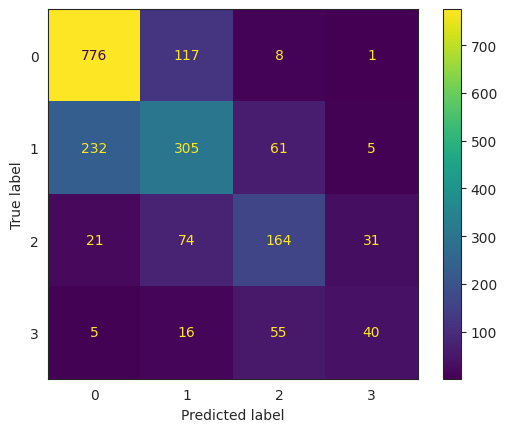

In [216]:
sns.set_style('white')
c1 = ConfusionMatrixDisplay(confusion_matrix(y_test, log_pred))
c1.plot()
plt.show()

<p style="font-size:140%;color:#0e3aff">Logistic Regression gives us decent results as the test accuracy is 67% and training accuracy is also 69% which means there is no overfitting and underfitting issue of the model.</p>

<h2 style="color:#aa557f">DECISION TREE CLASSIFIER ⤵️</h2>

In [217]:
from sklearn.tree import DecisionTreeClassifier

In [218]:
dtc=DecisionTreeClassifier()

In [219]:
dtc.fit(X_train, y_train)

DecisionTreeClassifier()

In [220]:
dtc_pred = dtc.predict(X_test)
dtc_pred

array([1, 1, 2, ..., 2, 1, 2])

In [221]:
print('ACCURACY SCORE : ', accuracy_score(y_test, dtc_pred))
print("Training accuracy :", dtc.score(X_train, y_train))
print("Test accuracy :", dtc.score(X_test, y_test))
print('Precision Score :', precision_score(y_test, dtc_pred, average='weighted'))
print('\n\n-------------------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, dtc_pred))
print('\n\n-------------------Clasification Report--------\n')
print(classification_report(y_test, dtc_pred))


ACCURACY SCORE :  0.6342229199372057
Training accuracy : 0.9591623036649215
Test accuracy : 0.6342229199372057
Precision Score : 0.6308191867935217


-------------------Confusion Matrix--------------

[[703 169  24   6]
 [205 307  75  16]
 [ 20  77 149  44]
 [  6  15  42  53]]


-------------------Clasification Report--------

              precision    recall  f1-score   support

           1       0.75      0.78      0.77       902
           2       0.54      0.51      0.52       603
           3       0.51      0.51      0.51       290
           4       0.45      0.46      0.45       116

    accuracy                           0.63      1911
   macro avg       0.56      0.56      0.56      1911
weighted avg       0.63      0.63      0.63      1911



In [222]:
dtc_score=cross_val_score(dtc,X,y,cv=5,scoring='accuracy')
print(dtc_score)
print()
print("cross validation score for Decision Tree :",np.mean(dtc_score))

[0.3877551  0.56230366 0.64136126 0.62722513 0.58167539]

cross validation score for Decision Tree : 0.5600641094133988


<Axes: >

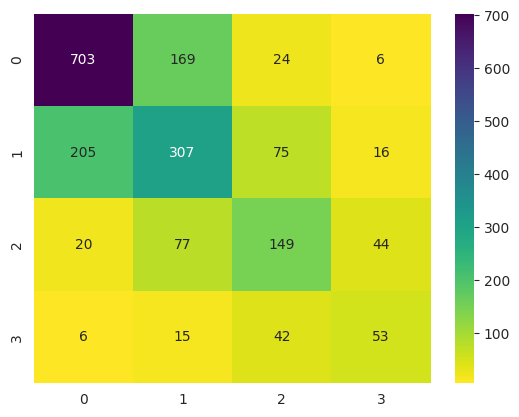

In [223]:
sns.heatmap(confusion_matrix(y_test, dtc_pred),fmt='0.9g',annot=True,cmap='viridis_r')

<p style="font-size:140%;color:#3826ff">Decision Tree is also a good model slightly less accuracte than Logistic Regression as it gives 63% accuracy and 95% training accuracy score.</p>

<h2 style="color:#00007f">RANDOM FOREST CLASSIFIER ⤵️</h2>

In [224]:
from sklearn.ensemble import RandomForestClassifier

In [225]:
rfc = RandomForestClassifier()

In [226]:
rfc.fit(X_train, y_train)

RandomForestClassifier()

In [227]:
rfc_pred = rfc.predict(X_test)
rfc_pred

array([2, 1, 2, ..., 2, 1, 2])

In [228]:
print('ACCURACY SCORE : ', accuracy_score(y_test, rfc_pred))
print("Training accuracy :", rfc.score(X_train, y_train))
print("Test accuracy :", rfc.score(X_test, y_test))
print('Precision Score :', precision_score(y_test, rfc_pred, average='weighted'))
print('\n\n-------------------Confusion Matrix--------------\n')
print(confusion_matrix(y_test, rfc_pred))
print('\n\n-------------------Clasification Report--------\n')
print(classification_report(y_test, rfc_pred))

ACCURACY SCORE :  0.6514913657770801
Training accuracy : 0.9591623036649215
Test accuracy : 0.6514913657770801
Precision Score : 0.6458779084909405


-------------------Confusion Matrix--------------

[[717 178   5   2]
 [209 318  65  11]
 [ 19  77 164  30]
 [  5  14  51  46]]


-------------------Clasification Report--------

              precision    recall  f1-score   support

           1       0.75      0.79      0.77       902
           2       0.54      0.53      0.53       603
           3       0.58      0.57      0.57       290
           4       0.52      0.40      0.45       116

    accuracy                           0.65      1911
   macro avg       0.60      0.57      0.58      1911
weighted avg       0.65      0.65      0.65      1911



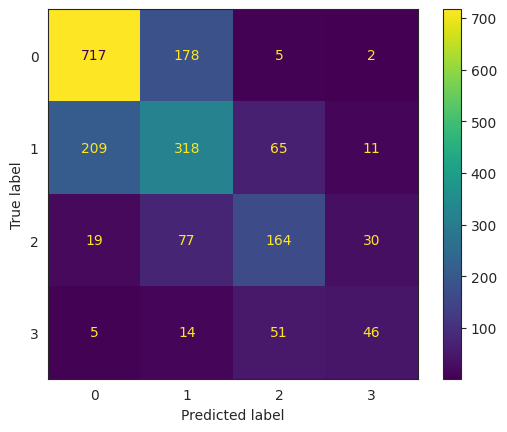

In [229]:
c2 = ConfusionMatrixDisplay(confusion_matrix(y_test, rfc_pred))
c2.plot()
plt.show()

<h2 style="color:#ab9050">K NEAREST NEIGHBOURS CLASSIFIER MODEL ⤵️</h2>

In [230]:
from sklearn.neighbors import KNeighborsClassifier

In [231]:
knn = KNeighborsClassifier()

In [232]:
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [233]:
knn_pred = knn.predict(X_test)
knn_pred

array([1, 1, 2, ..., 2, 1, 2])

In [234]:
print('ACCURACY SCORE : ', accuracy_score(y_test, knn_pred))
print("Training accuracy: ",knn.score(X_train,y_train))
print("Test accuracy : ",knn.score(X_test,y_test))
print('Precision Score :', precision_score(y_test, knn_pred, average='weighted'))
print('\n\n \n---------Confusion Matrix--------------\n')
print(confusion_matrix(y_test,knn_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test,knn_pred))

ACCURACY SCORE :  0.6624803767660911
Training accuracy:  0.7373036649214659
Test accuracy :  0.6624803767660911
Precision Score : 0.6514346951872827


 
---------Confusion Matrix--------------

[[752 145   5   0]
 [218 321  55   9]
 [ 33  75 156  26]
 [ 11  18  50  37]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           1       0.74      0.83      0.78       902
           2       0.57      0.53      0.55       603
           3       0.59      0.54      0.56       290
           4       0.51      0.32      0.39       116

    accuracy                           0.66      1911
   macro avg       0.60      0.56      0.57      1911
weighted avg       0.65      0.66      0.65      1911



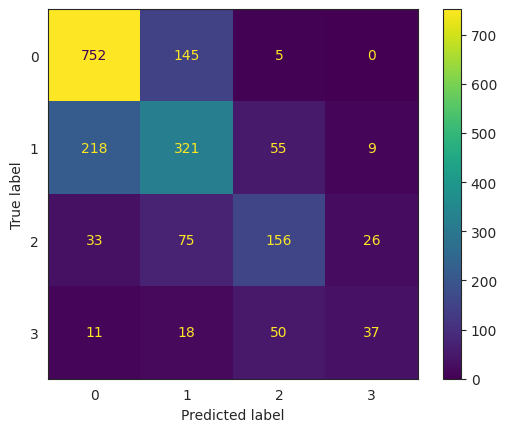

In [235]:
c3 = ConfusionMatrixDisplay(confusion_matrix(y_test, knn_pred))
c3.plot()
plt.show()

<h2 style="color:#35ab46">SUPPORT VECTOR MACHINE CLASSIFIER ⤵️</h2>

In [236]:
from sklearn.svm import SVC

In [237]:
svc = SVC()

In [238]:
svc.fit(X_train, y_train)

SVC()

In [239]:
svc_pred = svc.predict(X_test)
svc_pred

array([1, 1, 2, ..., 3, 1, 3])

In [240]:
print('ACCURACY SCORE : ', accuracy_score(y_test, svc_pred))
print("Training accuracy: ",svc.score(X_train,y_train))
print("Test accuracy : ",svc.score(X_test,y_test))
print('Precision Score :', precision_score(y_test, svc_pred, average='weighted'))
print('\n\n \n---------Confusion Matrix--------------\n')
print(confusion_matrix(y_test,svc_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test,svc_pred))

ACCURACY SCORE :  0.6650968079539508
Training accuracy:  0.6933246073298429
Test accuracy :  0.6650968079539508
Precision Score : 0.6537624797828585


 
---------Confusion Matrix--------------

[[799  94   8   1]
 [247 260  92   4]
 [ 23  63 190  14]
 [  7  10  77  22]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           1       0.74      0.89      0.81       902
           2       0.61      0.43      0.50       603
           3       0.52      0.66      0.58       290
           4       0.54      0.19      0.28       116

    accuracy                           0.67      1911
   macro avg       0.60      0.54      0.54      1911
weighted avg       0.65      0.67      0.65      1911



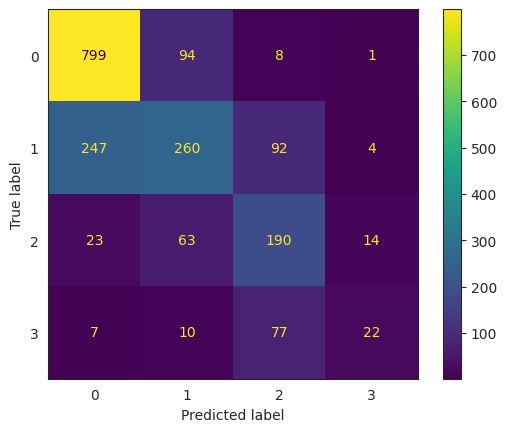

In [241]:
c4 = ConfusionMatrixDisplay(confusion_matrix(y_test, svc_pred))
c4.plot()
plt.show()

<h2 style="color:#aa5500">XGBOOST CLASSIFIER MODEL ⤵️</h2>

In [242]:
from xgboost import XGBClassifier

In [243]:
xgb = XGBClassifier()

In [244]:
xgb.fit(X_train, y_train.replace({1:0,2:1,3:2,4:3}))

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

In [245]:
xgb_pred = xgb.predict(X_test)

In [246]:
accuracy_score(y_test.replace({1:0,2:1,3:2,4:3}), xgb_pred)

0.6834118262689691

In [247]:
y_test1 = y_test.replace({1:0,2:1,3:2,4:3})

In [248]:
print('ACCURACY SCORE : ', accuracy_score(y_test1, xgb_pred))
print("Training accuracy: ", xgb.score(X_train, y_train))
print("Test accuracy : ", xgb.score(X_test, y_test1))
print('Precision Score :', precision_score(y_test1, xgb_pred, average='weighted'))
print('\n\n---------Confusion Matrix--------------\n')
print(confusion_matrix(y_test1, xgb_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test1, xgb_pred))

ACCURACY SCORE :  0.6834118262689691
Training accuracy:  0.047774869109947646
Test accuracy :  0.6834118262689691
Precision Score : 0.6727342572471853


---------Confusion Matrix--------------

[[784 112   5   1]
 [219 306  68  10]
 [ 20  72 173  25]
 [  6   7  60  43]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           0       0.76      0.87      0.81       902
           1       0.62      0.51      0.56       603
           2       0.57      0.60      0.58       290
           3       0.54      0.37      0.44       116

    accuracy                           0.68      1911
   macro avg       0.62      0.59      0.60      1911
weighted avg       0.67      0.68      0.67      1911



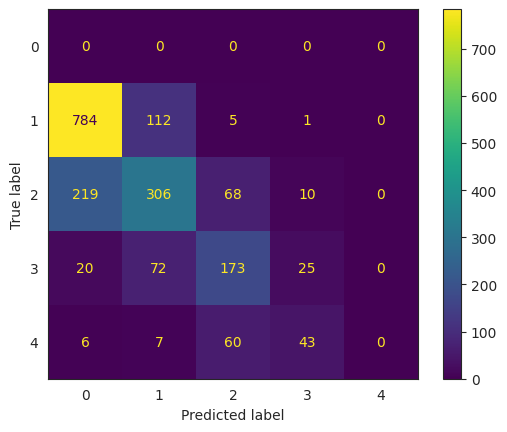

In [249]:
c5 = ConfusionMatrixDisplay(confusion_matrix(y_test, xgb_pred))
c5.plot()
plt.show()

<h2 style="color:#ff8000"> CATEGORY BOOSTING CLASSIFIER MODEL ⤵️</h2>

In [250]:
from catboost import CatBoostClassifier

In [251]:
cat = CatBoostClassifier(verbose=False)

In [252]:
cat.fit(X_train, y_train)

In [253]:
cat_pred = cat.predict(X_test)
cat_pred

array([[1],
       [1],
       [2],
       ...,
       [3],
       [1],
       [2]])

In [254]:
print('ACCURACY SCORE : ', accuracy_score(y_test, cat_pred))
print("Training accuracy: ",cat.score(X_train,y_train))
print("Test accuracy : ",cat.score(X_test,y_test))
print('Precision Score :', precision_score(y_test, cat_pred, average='weighted'))
print('\n\n---------Confusion Matrix--------------\n')
print(confusion_matrix(y_test,cat_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test,cat_pred))

ACCURACY SCORE :  0.696493982208268
Training accuracy:  0.7982984293193718
Test accuracy :  0.696493982208268
Precision Score : 0.6877764087439269


---------Confusion Matrix--------------

[[779 116   6   1]
 [207 327  63   6]
 [ 19  64 183  24]
 [  6  10  58  42]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           1       0.77      0.86      0.81       902
           2       0.63      0.54      0.58       603
           3       0.59      0.63      0.61       290
           4       0.58      0.36      0.44       116

    accuracy                           0.70      1911
   macro avg       0.64      0.60      0.61      1911
weighted avg       0.69      0.70      0.69      1911



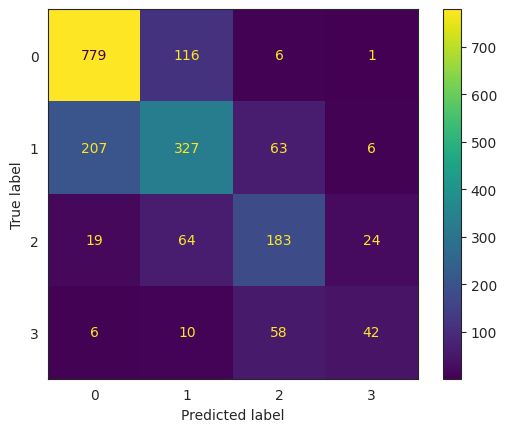

In [255]:
c6 = ConfusionMatrixDisplay(confusion_matrix(y_test, cat_pred))
c6.plot()
plt.show()

<h2 style="color:#55aaff">ADAPTIVE BOOSTING CLASSIFIER MODEL ⤵️</h2>

In [256]:
from sklearn.ensemble import AdaBoostClassifier

In [257]:
adaboost = AdaBoostClassifier()

In [258]:
adaboost.fit(X_train, y_train)

AdaBoostClassifier()

In [259]:
adaboost_pred = adaboost.predict(X_test)
adaboost_pred

array([1, 1, 2, ..., 2, 1, 1])

In [260]:
print('ACCURACY SCORE : ', accuracy_score(y_test, adaboost_pred))
print("Training accuracy: ",adaboost.score(X_train,y_train))
print("Test accuracy : ",adaboost.score(X_test,y_test))
print('Precision Score :', precision_score(y_test, adaboost_pred, average='weighted'))
print('\n\n \n---------Confusion Matrix--------------\n')
print(confusion_matrix(y_test,adaboost_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test,adaboost_pred))

ACCURACY SCORE :  0.6530612244897959
Training accuracy:  0.6520942408376963
Test accuracy :  0.6530612244897959
Precision Score : 0.642585450766915


 
---------Confusion Matrix--------------

[[752 144   6   0]
 [239 298  59   7]
 [ 21  80 138  51]
 [  4  15  37  60]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           1       0.74      0.83      0.78       902
           2       0.55      0.49      0.52       603
           3       0.57      0.48      0.52       290
           4       0.51      0.52      0.51       116

    accuracy                           0.65      1911
   macro avg       0.59      0.58      0.59      1911
weighted avg       0.64      0.65      0.65      1911



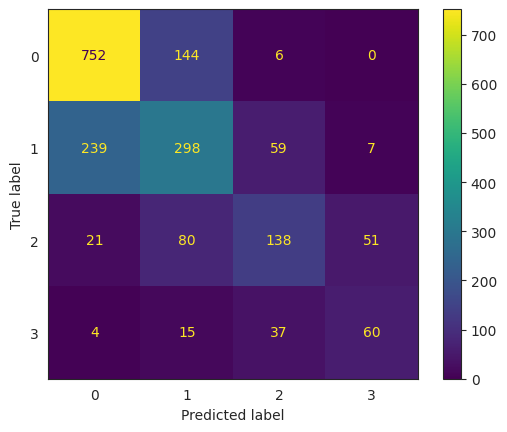

In [261]:
c7 = ConfusionMatrixDisplay(confusion_matrix(y_test, adaboost_pred))
c7.plot()
plt.show()

<h2 style="color:#573345">GRADIENT BOOSTING CLASSIFIER MODEL ⤵️</h2>

In [262]:
from sklearn.ensemble import GradientBoostingClassifier

In [263]:
gbc = GradientBoostingClassifier()

In [264]:
gbc.fit(X_train, y_train)

GradientBoostingClassifier()

In [265]:
gbc_pred = gbc.predict(X_test)
gbc_pred

array([1, 1, 2, ..., 3, 1, 2])

In [266]:
print('ACCURACY SCORE : ', accuracy_score(y_test, gbc_pred))
print("Training accuracy: ",gbc.score(X_train,y_train))
print("Test accuracy : ",gbc.score(X_test,y_test))
print('Precision Score :', precision_score(y_test, gbc_pred, average='weighted'))
print('\n\n \n---------Confusion Matrix--------------\n')
print(confusion_matrix(y_test,gbc_pred))
print('\n\n \n---------Classification Report--------------\n')
print(classification_report(y_test,gbc_pred))

ACCURACY SCORE :  0.6902145473574045
Training accuracy:  0.7200261780104712
Test accuracy :  0.6902145473574045
Precision Score : 0.680719411052092


 
---------Confusion Matrix--------------

[[784 111   5   2]
 [213 318  68   4]
 [ 20  71 176  23]
 [  5  11  59  41]]


 
---------Classification Report--------------

              precision    recall  f1-score   support

           1       0.77      0.87      0.81       902
           2       0.62      0.53      0.57       603
           3       0.57      0.61      0.59       290
           4       0.59      0.35      0.44       116

    accuracy                           0.69      1911
   macro avg       0.64      0.59      0.60      1911
weighted avg       0.68      0.69      0.68      1911



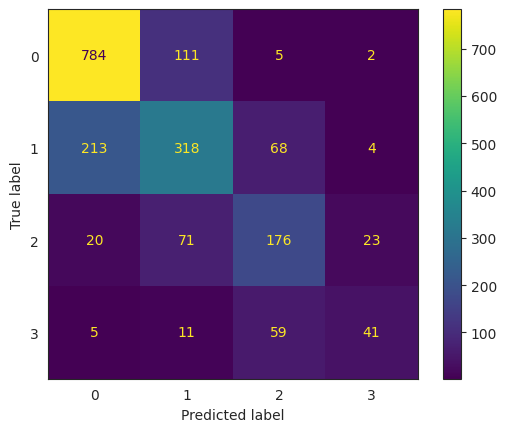

In [267]:
c8 = ConfusionMatrixDisplay(confusion_matrix(y_test, gbc_pred))
c8.plot()
plt.show()

<h2>CROSS VALIDATION SCORES ⤵️</h2>

In [268]:
from sklearn.model_selection import cross_val_score

np.random.seed(10)
def acc_test(model, X_train,y_train):
    acc = cross_val_score(model, X ,y , scoring='accuracy', cv=5)
    return(acc)


models = [LogisticRegression(),
          DecisionTreeClassifier(),
          AdaBoostClassifier(),
          RandomForestClassifier(),
          SVC(),
          KNeighborsClassifier(),
          GradientBoostingClassifier(),
          CatBoostClassifier(verbose=False)]
            


names = ['LR', 'DTC', 'ADABOOST', 'RFC', 'SVC', 'KNN', 'GBC','CAT']

for model,name in zip(models,names):
    score = acc_test(model,X_train,y_train)
    print(name, score)
    print("{}    : {:.6f}, {:4f}".format(name,score.mean(),score.std()))
    print('**************************************************************')

LR [0.46677132 0.46492147 0.46544503 0.46544503 0.55549738]
LR    : 0.483616, 0.035946
**************************************************************
DTC [0.37781266 0.56753927 0.63664921 0.61937173 0.58534031]
DTC    : 0.557343, 0.093012
**************************************************************
ADABOOST [0.36839351 0.53246073 0.65340314 0.62879581 0.3434555 ]
ADABOOST    : 0.505302, 0.128733
**************************************************************
RFC [0.38827839 0.56335079 0.66073298 0.65863874 0.60837696]
RFC    : 0.575876, 0.100455
**************************************************************
SVC [0.46520147 0.46492147 0.46544503 0.46544503 0.51832461]
SVC    : 0.475868, 0.021229
**************************************************************
KNN [0.29042386 0.52827225 0.6591623  0.65287958 0.23455497]
KNN    : 0.473059, 0.179030
**************************************************************
GBC [0.40450026 0.5921466  0.68115183 0.66806283 0.64293194]
GBC    : 0.597759, 

In [269]:
model_names = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'SVM', 'KNN', 'ADABOOST', 'Gradient Boosting', 'CATBOOST']
models = [log_pred, dtc_pred, rfc_pred, svc_pred, knn_pred,adaboost_pred, gbc_pred, cat_pred]
accscorelist = []
for x in models:
    print(accuracy_score(y_test, x))
    accscorelist.append(accuracy_score(y_test, x))
print(accscorelist)

0.6724228152799582
0.6342229199372057
0.6514913657770801
0.6650968079539508
0.6624803767660911
0.6530612244897959
0.6902145473574045
0.696493982208268
[0.6724228152799582, 0.6342229199372057, 0.6514913657770801, 0.6650968079539508, 0.6624803767660911, 0.6530612244897959, 0.6902145473574045, 0.696493982208268]


In [270]:
scores1 = pd.DataFrame({
    'Model': model_names,
    'Accuracy Score': accscorelist
})
scores1 = scores1._append({"Model":"XGBOOST", 'Accuracy Score':0.68}, ignore_index=True)
scores1 = scores1.sort_values(by='Accuracy Score', ascending=False)

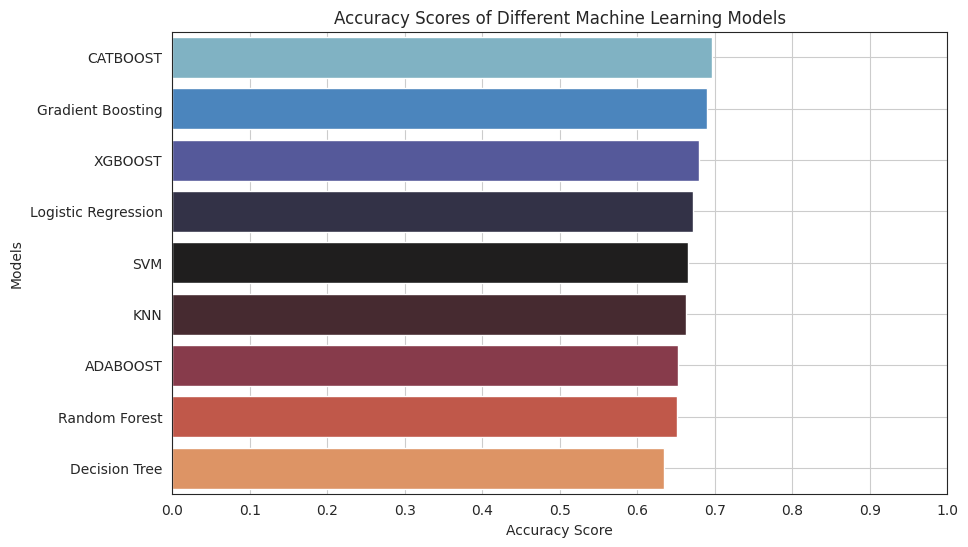

In [271]:
plt.figure(figsize=(10, 6))
sns.barplot(data=scores1, y='Model', x='Accuracy Score', palette='icefire')
plt.title('Accuracy Scores of Different Machine Learning Models')
plt.ylabel('Models')
plt.xlabel('Accuracy Score')
plt.xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0])
plt.grid()
plt.show()

<p style="font-size:140%;color:#0c1fcc">Now, We have trained and tested all models and the best performing model is CatBoost model which give 70% accuracy score.</h2>
<p style="font-size:140%;color:#aa55ff">Other models also performed really well and almost all other models like XGBOOST, Gradient Boost and logistic Regression. These 3 models algo gave accuracy of 0.68, 0.68 and 0.67 respectively.</p>
<p style="font-size:140%;color:#2badb4">No, we will try to hyperparameter tune our CatBoost model to see if we can improve even further.</p>

<h2>HYPERPARAMETER TUNING ⤵️</h2>

In [272]:
from sklearn.model_selection import RandomizedSearchCV

In [273]:
param_grid = {
    'iterations': [100, 200, 500],
    'learning_rate': [0.01, 0.05, 0.1],
    'depth': [4, 6, 8, 10],
    'l2_leaf_reg': [1, 3, 5, 7, 9],
    'border_count': [32, 64, 128],
    'bagging_temperature': [0, 0.5, 1],
    'random_strength': [1, 2, 5, 10],
}

In [274]:
cat_random = RandomizedSearchCV(CatBoostClassifier(verbose=False), param_distributions=param_grid, scoring='accuracy', n_jobs=-1, cv=5, verbose=False)

In [276]:
cat_random.fit(X_train, y_train)

RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostClassifier object at 0x73d043932fd0>,
                   n_jobs=-1,
                   param_distributions={'bagging_temperature': [0, 0.5, 1],
                                        'border_count': [32, 64, 128],
                                        'depth': [4, 6, 8, 10],
                                        'iterations': [100, 200, 500],
                                        'l2_leaf_reg': [1, 3, 5, 7, 9],
                                        'learning_rate': [0.01, 0.05, 0.1],
                                        'random_strength': [1, 2, 5, 10]},
                   scoring='accuracy', verbose=False)

In [277]:
cat_random.best_score_

0.6856020942408377

<p style="font-size:140%;color:#4a67aa">We can see that even after hyperparameter tuning techniques like RandomizedSearch we cannot improve the model even by a slight margin. The original CatBoost model gives 70% accuracy which is fairly good. So, we will stop here and save the model using joblib library for further reference.</p>

<h2 style="color:purple">SAVING THE MODEL ⤵️</h2>

In [278]:
joblib.dump(value=cat, filename='Zomato_Price_Range_Classification.pkl')

['Zomato_Price_Range_Classification.pkl']

<h1>DOCUMENTATION ⬇️</h1>

<p style="font-size:140%;color:#797979">We first imported the dataset using pandas dataframe and imported country code excel file, merged them together to create a new dataframe and did some visual representation of the dataset, then cleaned the dataset by filling null values with most frequent values of the respective columns.The, we created a new column or let's say we transformed the average cost for two column which contained prices in multiple currencies to a column which contained all the prices in USD dollars.</p>
<br>
<p style="font-size:140%;color:#797979">Further Now, we created 4 new columns containing mean values of average cost for two people based on City, Country and the 3rd column we created contained mean values of Aggregate Rating by City. Finally, the 4th column contains mean votes by city. Also, earlier, we filled all the null values in the cuisines column with the most frequent occuring value. Next, we created 14 new columns containing the popular cuisines on Zomato. Basically, it was similar to One Hot Encoding and we also did one hot encoding on categorical columns like <u>City, Country, Rating text, etc</u>. We also dropped irrelevant columns like Restaurant Id, Restaurant Name, Locality Verbose, etc.</p>
<br>
<p style="font-size:140%;color:#797979">We built many histograms, kdeplots, boxplots, violinplots, pie charts of all the numerical columns in the dataset. The, using seaborn library we built the co-relation heatmap between all the columns. Then, some stripplots were plotted to gain more information regarding the dataset. Also, barplots containing mean or average value of some numerical column like Average Cost for two with respect to City, Country with the help of groupby method. Then, crosstabs were used to plot many countplots for additional information. We removed Skewness from "Votes" column with the help of PowerTransformer technique yeo-johnson.
Then, we split the data into training and testing data and then scaled the data using Standard Scaler.</p>
<br>
<p style="font-size:140%;color:#797979">One important thing to note is that we built two models different one to predict the Average Cost for two in USD dollars and the second one to predict the Price range.</p>
<br>
<p style="font-size:140%;color:#797979">We first trained multiple models to predict the Average Cost for two in USD $ and tested them and the results are given below.</p>
<br>
<p style="font-size:140%;color:#797979">The model chosen for this task is a supervised learning model suitable for regression tasks. The following models were evaluated:</p>

<p style="font-size:120%;color:#797979">
    <ul style="font-size:140%;color:#797979">
        <li>Linear Regression</li>
        <li>Decision Tree</li>
        <li>Random Forest</li>
        <li>SVM</li>
        <li>Extra Tre</li>
        <li>KNN</li>
        <li>Gradient Boosting</li>
        <li>XGBOOST</li>
        <li>CatBoosting</li>
    </ul>
</p>
<br>
<p style="font-size:140%;color:#797979">The selected model Random Forest was trained using a training dataset split from the original dataset. Cross-validation was used to tune hyperparameters to optimize performance metrics such as Mean Absolute Error (MAE), Mean Squared Error (MSE), Root Mean Squared Error(RMSE), R2 SCORE and Mean Absolute Percentage Error.
</p>
<br>
<p style="font-size:140%;color:#797979">RANDOM FOREST RAINFALL PREDICTION MODEL RESULTS : ⤵️ </p>

<pre style="font-size:140%;color:#797979">⚫ The mean absolute error (MAE) is 3.9361997336118737

⚫ The mean sqaured error (MSE) is 109.81645083517567

⚫ The root mean sqaured error (RMSE) is 10.479334465278589

⚫ The R2 SCORE is 0.6579138094650904

⚫ Training r2 score is 0.9378155014081989

⚫ The mean absolute percentage error is 95678514532504.28
</pre>
<hr>
<p style="font-size:140%;color:#797979">The next model chosen for predicting the Price range which is a supervised learning model suitable for binary classification tasks. The following models were evaluated:</p>
<p style="font-size:120%;color:#797979">
    <ul style="font-size:140%;color:#797979">
        <li>Logistic Regression</li>
        <li>Decision Tree</li>
        <li>Random Forest</li>
        <li>SVM</li>
        <li>KNN</li>
        <li>AdaBoost</li>
        <li>Gradient Boosting</li>
        <li>XGBOOST</li>
        <li>CatBoosting</li>
    </ul>
</p>
<br>
<p style="font-size:140%;color:#797979">The selected model CatBoost was trained using a training dataset split from the original dataset. Cross-validation was used to tune hyperparameters to optimize performance metrics such as accuracy, precision, recall, F1 Score.
</p>
<p style="font-size:140%;color:#797979">CATBOOST MODEL RESULTS : ⤵️</p>

<pre style="font-size:140%;color:#797979">⚫ ACCURACY SCORE :  0.6902145473574045
    
⚫ Training accuracy:  0.7200261780104712
    
⚫ Precision :
    ➡️ Macro : 0.64
    ➡️ Weighted : 0.69
    
⚫ Recall : 
    ➡️ Macro : 0.60
    ➡️ Weighted : 0.70
    
⚫ F1-score :
    ➡️ Macro : 0.61
    ➡️ Weighted : 0.69
</pre>
<hr>
<p style="font-size:140%;color:#797979">The two models created are very robust and up to date models which are able to predict the Average Cost for two people in USD $ and the Price range. These two models will predict based on various features like City, Country, Rating of restaurant, etc.</p>
<hr>

<h1>THANK YOU</h1>